In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns

In [ ]:
df = pd.read_csv("SpotifyFeatures.csv")

In [ ]:
df.head(5)

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
0,Movie,Henri Salvador,C'est beau de faire un Show,0BRjO6ga9RKCKjfDqeFgWV,0,0.611,0.389,99373,0.910,0.000,C#,0.3460,-1.828,Major,0.0525,166.969,4/4,0.814
1,Movie,Martin & les fées,Perdu d'avance (par Gad Elmaleh),0BjC1NfoEOOusryehmNudP,1,0.246,0.590,137373,0.737,0.000,F#,0.1510,-5.559,Minor,0.0868,174.003,4/4,0.816
2,Movie,Joseph Williams,Don't Let Me Be Lonely Tonight,0CoSDzoNIKCRs124s9uTVy,3,0.952,0.663,170267,0.131,0.000,C,0.1030,-13.879,Minor,0.0362,99.488,5/4,0.368
3,Movie,Henri Salvador,Dis-moi Monsieur Gordon Cooper,0Gc6TVm52BwZD07Ki6tIvf,0,0.703,0.240,152427,0.326,0.000,C#,0.0985,-12.178,Major,0.0395,171.758,4/4,0.227
4,Movie,Fabien Nataf,Ouverture,0IuslXpMROHdEPvSl1fTQK,4,0.950,0.331,82625,0.225,0.123,F,0.2020,-21.150,Major,0.0456,140.576,4/4,0.390


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 232725 entries, 0 to 232724
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   genre             232725 non-null  object 
 1   artist_name       232725 non-null  object 
 2   track_name        232725 non-null  object 
 3   track_id          232725 non-null  object 
 4   popularity        232725 non-null  int64  
 5   acousticness      232725 non-null  float64
 6   danceability      232725 non-null  float64
 7   duration_ms       232725 non-null  int64  
 8   energy            232725 non-null  float64
 9   instrumentalness  232725 non-null  float64
 10  key               232725 non-null  object 
 11  liveness          232725 non-null  float64
 12  loudness          232725 non-null  float64
 13  mode              232725 non-null  object 
 14  speechiness       232725 non-null  float64
 15  tempo             232725 non-null  float64
 16  time_signature    23

In [ ]:
len(df)

232725

###Preprocessing

In [ ]:
#Check NA values
df.isna().sum().sum()

0

In [ ]:
# keep columns where there are more than 1 unique values
df = df[[col for col in df if df[col].nunique() > 1]]

In [ ]:
#drop duplicates
df=df.drop_duplicates(subset=['track_name', 'artist_name'])

In [ ]:
len(df)

176514

In [ ]:
df.duration_ms=df.duration_ms*0.001

Get rid of too short and to long tracks

In [ ]:
df[(df.duration_ms < df.duration_ms.quantile(.95)) & (df.duration_ms > df.duration_ms.quantile(.05))]

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
0,Movie,Henri Salvador,C'est beau de faire un Show,0BRjO6ga9RKCKjfDqeFgWV,0,0.6110,0.389,99.373,0.9100,0.000000,C#,0.3460,-1.828,Major,0.0525,166.969,4/4,0.814
1,Movie,Martin & les fées,Perdu d'avance (par Gad Elmaleh),0BjC1NfoEOOusryehmNudP,1,0.2460,0.590,137.373,0.7370,0.000000,F#,0.1510,-5.559,Minor,0.0868,174.003,4/4,0.816
2,Movie,Joseph Williams,Don't Let Me Be Lonely Tonight,0CoSDzoNIKCRs124s9uTVy,3,0.9520,0.663,170.267,0.1310,0.000000,C,0.1030,-13.879,Minor,0.0362,99.488,5/4,0.368
3,Movie,Henri Salvador,Dis-moi Monsieur Gordon Cooper,0Gc6TVm52BwZD07Ki6tIvf,0,0.7030,0.240,152.427,0.3260,0.000000,C#,0.0985,-12.178,Major,0.0395,171.758,4/4,0.227
5,Movie,Henri Salvador,Le petit souper aux chandelles,0Mf1jKa8eNAf1a4PwTbizj,0,0.7490,0.578,160.627,0.0948,0.000000,C#,0.1070,-14.970,Major,0.1430,87.479,4/4,0.358
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
232714,Soul,H-Town,They Like It Slow,2XoAEpBuM4AtQIQYUEowRy,39,0.1130,0.611,279.510,0.4930,0.000000,C#,0.1050,-9.297,Major,0.0354,115.920,4/4,0.443
232716,Soul,John Legend,Quickly (feat. Brandy),1U0OMWvR89Cm20vCNar50f,39,0.2310,0.736,222.667,0.7010,0.000000,A#,0.2030,-4.345,Minor,0.1000,99.991,4/4,0.770
232717,Soul,Belly,P.O.P.,2gGqKJWfWbToha2YmDxnnj,43,0.1040,0.802,201.173,0.5160,0.000485,D,0.1050,-9.014,Major,0.2130,175.666,4/4,0.482
232721,Soul,Jr Thomas & The Volcanos,Burning Fire,1qWZdkBl4UVPj9lK6HuuFM,38,0.0329,0.785,282.447,0.6830,0.000880,E,0.2370,-6.944,Minor,0.0337,113.830,4/4,0.969


In [ ]:
import seaborn as sns
numerical=['popularity', 'acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness','tempo', 'valence']
sns.pairplot(df[numerical],kind='scatter', plot_kws=dict(alpha=0.2)
          )

In [ ]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.figure_factory as ff
import plotly.express as px


In [791]:
features = ['popularity', 'acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness','tempo', 'valence']
# plotting of 4 first variables
fig = make_subplots(cols=2, rows=5, subplot_titles=features)

for i, feature in enumerate(features):
    if feature=='spechiness':
        fig.add_trace(go.Histogram(x=np.log(df[feature]), name=feature), row=i//2 + 1, col=i%2 + 1)
    else:
       fig.add_trace(go.Histogram(x=df[feature], name=feature), row=i//2 + 1, col=i%2 + 1)

width = 1000
height = 600

fig.update_layout(width=width, height=height, title='feature distribution')

fig.show()

#fig.write_image(os.path.join('images', fig.layout['title']['text'] + '.png'))

In [ ]:
sns.countplot(y="genre", data=df, color='purple')

In [793]:
#drop the less popular genre
df=df[df.genre.str.contains('A Capella')==False]
df.head(3)

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
0,Movie,Henri Salvador,C'est beau de faire un Show,0BRjO6ga9RKCKjfDqeFgWV,0,0.611,0.389,99.373,0.910,0.0,C#,0.346,-1.828,Major,0.0525,166.969,4/4,0.814
1,Movie,Martin & les fées,Perdu d'avance (par Gad Elmaleh),0BjC1NfoEOOusryehmNudP,1,0.246,0.590,137.373,0.737,0.0,F#,0.151,-5.559,Minor,0.0868,174.003,4/4,0.816
2,Movie,Joseph Williams,Don't Let Me Be Lonely Tonight,0CoSDzoNIKCRs124s9uTVy,3,0.952,0.663,170.267,0.131,0.0,C,0.103,-13.879,Minor,0.0362,99.488,5/4,0.368


In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

def scale_col(i, dset):
    scaler = StandardScaler()
    scaler.fit(dset[i].values.reshape(-1, 1))
    dset[i]=scaler.transform(dset[i].values.reshape(-1, 1)) 

In [ ]:
numerical=['popularity', 'acousticness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'loudness', 'speechiness','tempo', 'valence']
for j in numerical:
    scale_col(j, df)

In [ ]:
df.head(3)

,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence
0,Movie,Henri Salvador,C'est beau de faire un Show,0BRjO6ga9RKCKjfDqeFgWV,-2.086903,0.566371,-0.799283,99.373,1.278502,-0.533314,C#,0.574393,1.298296,Major,-0.366857,1.588237,4/4,1.352571
1,Movie,Martin & les fées,Perdu d'avance (par Gad Elmaleh),0BjC1NfoEOOusryehmNudP,-2.029374,-0.430323,0.256286,137.373,0.651199,-0.533314,F#,-0.348893,0.715174,Minor,-0.199144,1.812790,4/4,1.360038
2,Movie,Joseph Williams,Don't Let Me Be Lonely Tonight,0CoSDzoNIKCRs124s9uTVy,-1.914316,1.497529,0.639652,170.267,-1.546174,-0.533314,C,-0.576163,-0.585167,Minor,-0.446558,-0.566018,5/4,-0.312590


In [ ]:
df['time_signature'].value_counts()

4/4    148888
3/4     20750
5/4      4415
1/4      2336
0/4         6
Name: time_signature, dtype: int64

In [ ]:
df['mode'].value_counts()

In [ ]:
df_cp = df

In [800]:
df=df[numerical]

#one-hot encoding of categoriacal features

#As modes are very correlating features we will make one column (not two by ohe)
#tab1=pd.get_dummies(df_cp['mode'])
mode_dict = {'Major' : 1, 'Minor' : 0}
tab1 = df_cp['mode'].replace(mode_dict)

#ohe of key feature
tab2=pd.get_dummies(df_cp['key'])


df=pd.concat([df, tab1, tab2, df_cp['genre']],axis=1)

df['time_signature'] = df_cp['time_signature'].apply(lambda x : int(x[0]))

df.head()

,popularity,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,mode,A,A#,B,C,C#,D,D#,E,F,F#,G,G#,genre,time_signature
0,-2.086903,0.566371,-0.799283,1.278502,-0.533314,0.574393,1.298296,-0.366857,1.588237,1.352571,1,0,0,0,0,1,0,0,0,0,0,0,0,Movie,4
1,-2.029374,-0.430323,0.256286,0.651199,-0.533314,-0.348893,0.715174,-0.199144,1.812790,1.360038,0,0,0,0,0,0,0,0,0,0,1,0,0,Movie,4
2,-1.914316,1.497529,0.639652,-1.546174,-0.533314,-0.576163,-0.585167,-0.446558,-0.566018,-0.312590,0,0,0,0,1,0,0,0,0,0,0,0,0,Movie,5
3,-2.086903,0.817592,-1.581770,-0.839098,-0.533314,-0.597470,-0.319316,-0.430422,1.741121,-0.839019,1,0,0,0,0,1,0,0,0,0,0,0,0,Movie,4
4,-1.856788,1.492068,-1.103876,-1.205327,-0.152645,-0.107418,-1.721559,-0.400596,0.745670,-0.230452,1,0,0,0,0,0,0,0,0,1,0,0,0,Movie,4


Let's build heatmap

In [801]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def corr_heatmap(data):
    corr_matrix = data.corr()
    mask = np.zeros_like(corr_matrix, dtype=np.bool)
    mask[np.triu_indices_from(mask)]= True
    f, ax = plt.subplots(figsize=(20, 25)) 
    heatmap = sns.heatmap(corr_matrix, 
                          mask = mask,
                          square = True,
                          linewidths = .9,
                          cmap = 'coolwarm',
                          cbar_kws = {'shrink': .4, 
                                   'ticks' : [-1, -.5, 0, 0.5, 1]},
                          vmin = -1, 
                          vmax = 1,
                          annot = True,
                          annot_kws = {'size': 9})#add the column names as labels
    ax.set_yticklabels(corr_matrix.columns, rotation = 0)
    ax.set_xticklabels(corr_matrix.columns)
    sns.set_style({'xtick.bottom': True}, {'ytick.left': True})


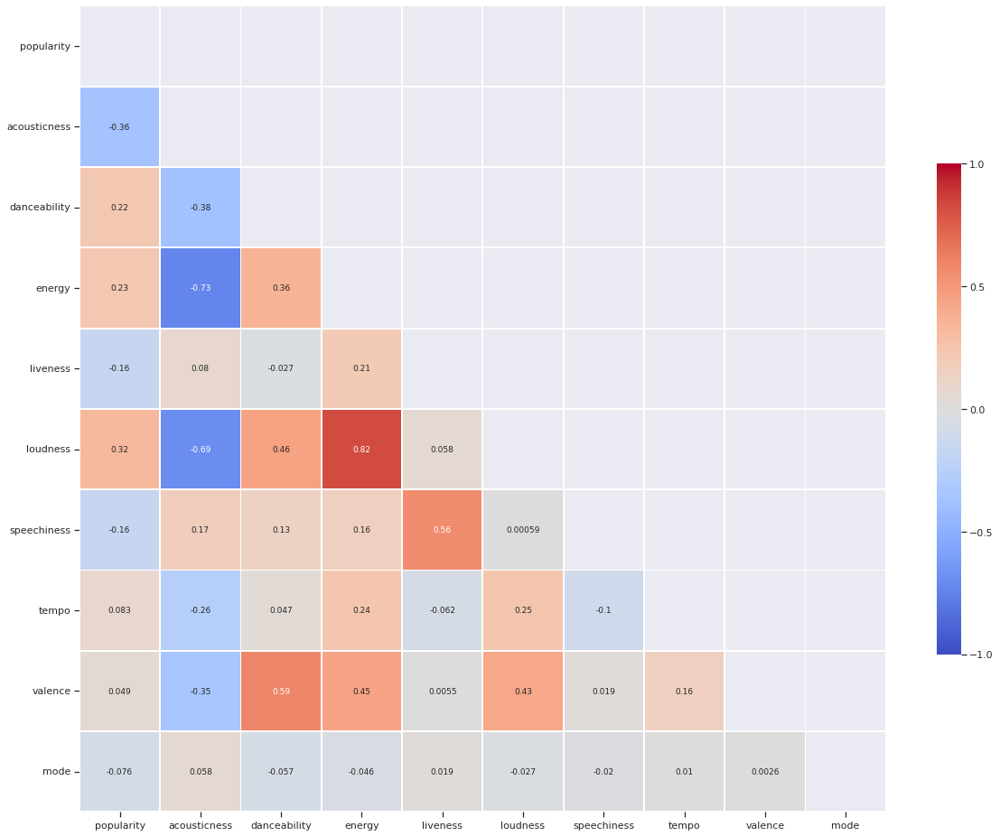

In [802]:
corr_heatmap(df[['popularity', 'acousticness', 'danceability','energy', 'liveness','loudness',
                'speechiness', 'tempo','valence', 'mode']])

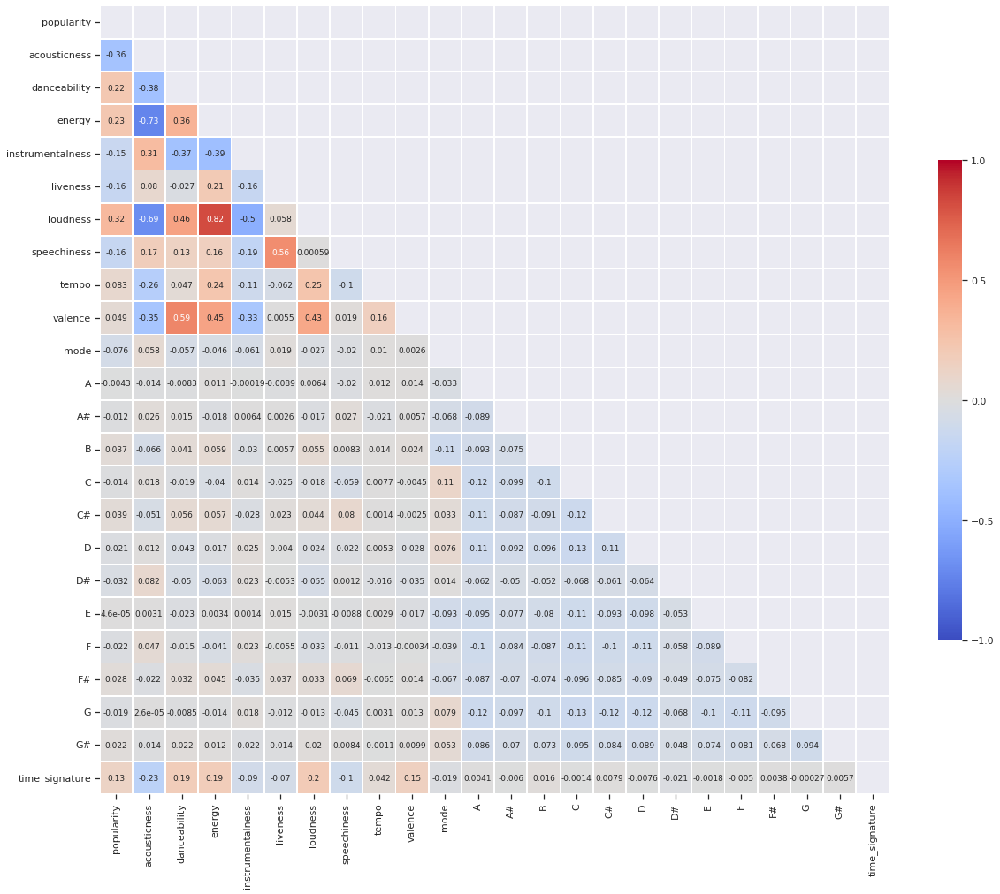

In [803]:
corr_heatmap(df)

As energy feature is very correlatin with other, let's drop it

In [804]:
df=df.drop(columns=['energy'], axis=1)

In [805]:
df.head(1)

,popularity,acousticness,danceability,instrumentalness,liveness,loudness,speechiness,tempo,valence,mode,A,A#,B,C,C#,D,D#,E,F,F#,G,G#,genre,time_signature
0,-2.086903,0.566371,-0.799283,-0.533314,0.574393,1.298296,-0.366857,1.588237,1.352571,1,0,0,0,0,1,0,0,0,0,0,0,0,Movie,4


Feature analysis

###fewer classes

In [806]:
df.genre.value_counts()

Comedy              9674
Electronic          9150
Alternative         9098
Anime               8935
Classical           8703
Reggae              8687
Reggaeton           8548
Soundtrack          8480
Blues               8474
Opera               8280
Folk                8050
Ska                 8010
Dance               7993
World               7961
Jazz                7957
Movie               7801
Hip-Hop             7414
Country             7382
Children's Music    5400
R&B                 5316
Soul                4413
Indie               3310
Pop                 2410
Rock                2225
Rap                 1455
Children’s Music    1269
Name: genre, dtype: int64

In [807]:
particular=['Rock', 'Rap', 'Pop','Jazz', 'Classical', 'Reggae', 'Opera', 'Indie', 'Blues', 'Electronic']

In [808]:
df_g=pd.DataFrame(columns=df.columns)
df_g.head()

,popularity,acousticness,danceability,instrumentalness,liveness,loudness,speechiness,tempo,valence,mode,A,A#,B,C,C#,D,D#,E,F,F#,G,G#,genre,time_signature


In [809]:
for g in particular:
    df_g=pd.concat([df_g, df[df.genre == str(g)].sample(n = 1000, random_state=42) ])
df_g.head(3)

,popularity,acousticness,danceability,instrumentalness,liveness,loudness,speechiness,tempo,valence,mode,A,A#,B,C,C#,D,D#,E,F,F#,G,G#,genre,time_signature
154380,1.019650,-0.665161,0.392827,-0.533314,-0.597470,0.915383,-0.450470,-0.614957,1.281633,1,0,0,0,0,0,0,0,0,0,0,1,0,Rock,4
154398,0.847064,-0.334750,0.303550,-0.533314,-0.500406,0.862713,-0.449981,0.054582,-0.779283,1,0,0,0,1,0,0,0,0,0,0,0,0,Rock,4
223373,1.134708,-0.651507,-1.450480,-0.516911,0.503371,0.717831,-0.389350,0.994677,-0.839019,1,0,0,0,0,1,0,0,0,0,0,0,0,Rock,4


In [810]:
df_g.genre.value_counts()

Classical     1000
Opera         1000
Jazz          1000
Electronic    1000
Rap           1000
Rock          1000
Reggae        1000
Pop           1000
Blues         1000
Indie         1000
Name: genre, dtype: int64

In [811]:
numerical=['popularity', 'acousticness', 'danceability', 'instrumentalness', 'liveness', 'loudness', 'speechiness','tempo', 'valence']
df_g[numerical].head(3)

,popularity,acousticness,danceability,instrumentalness,liveness,loudness,speechiness,tempo,valence
154380,1.019650,-0.665161,0.392827,-0.533314,-0.597470,0.915383,-0.450470,-0.614957,1.281633
154398,0.847064,-0.334750,0.303550,-0.533314,-0.500406,0.862713,-0.449981,0.054582,-0.779283
223373,1.134708,-0.651507,-1.450480,-0.516911,0.503371,0.717831,-0.389350,0.994677,-0.839019


In [812]:
from sklearn.model_selection import train_test_split
X = df_g.drop(columns=['genre'], axis=1)
y = df_g['genre']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=True, stratify=y)

In [813]:
len(X_train)

8000

#INitial models

Logistic Regression

In [ ]:
#logistic regression
from sklearn.linear_model import LogisticRegression
model = LogisticRegression(multi_class = 'multinomial', solver='lbfgs', max_iter=5000)

model.fit(X_train, y_train)
y_pred = model.predict(X_test)

In [ ]:
from sklearn.metrics import classification_report as report
print('logreg accuracy', acc(y_test, y_pred))
print(report(y_test, y_pred, digits=3))

logreg accuracy 0.573
              precision    recall  f1-score   support

       Blues      0.566     0.600     0.583       200
   Classical      0.679     0.625     0.651       200
  Electronic      0.591     0.570     0.580       200
       Indie      0.383     0.335     0.357       200
        Jazz      0.500     0.425     0.459       200
       Opera      0.746     0.795     0.770       200
         Pop      0.536     0.590     0.562       200
         Rap      0.575     0.615     0.594       200
      Reggae      0.578     0.610     0.594       200
        Rock      0.543     0.565     0.554       200

    accuracy                          0.573      2000
   macro avg      0.570     0.573     0.570      2000
weighted avg      0.570     0.573     0.570      2000



In [ ]:
from sklearn.metrics import accuracy_score as acc
from sklearn.metrics import log_loss as logloss
from sklearn.metrics import f1_score as f1

In [ ]:
lg_loan_status_probas = model.predict_proba(X_test)
lg_log_loss = logloss(y_test, lg_loan_status_probas)

Random Forest 

In [ ]:
#random forest classifier
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(n_estimators=150, random_state=42)
rfc.fit(X_train, y_train)
y_pred = rfc.predict(X_test)

In [ ]:
print('Random forest accuracy ', acc(y_test, y_pred))
print(report(y_test, y_pred, digits=3))

Random forest accuracy  0.6435
              precision    recall  f1-score   support

       Blues      0.587     0.660     0.621       200
   Classical      0.835     0.735     0.782       200
  Electronic      0.668     0.655     0.662       200
       Indie      0.489     0.335     0.398       200
        Jazz      0.569     0.535     0.552       200
       Opera      0.860     0.920     0.889       200
         Pop      0.565     0.675     0.615       200
         Rap      0.626     0.660     0.642       200
      Reggae      0.676     0.605     0.639       200
        Rock      0.557     0.655     0.602       200

    accuracy                          0.643      2000
   macro avg      0.643     0.643     0.640      2000
weighted avg      0.643     0.643     0.640      2000



KNN model

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

knn = KNeighborsClassifier(n_neighbors=10)

knn.fit(X_train, y_train)

y_pred=knn.predict(X_test) 

In [ ]:
X_train.head(3)

,popularity,acousticness,danceability,instrumentalness,liveness,loudness,speechiness,tempo,valence,mode,A,A#,B,C,C#,D,D#,E,F,F#,G,G#,time_signature
148747,0.674478,1.385571,-1.534506,-0.533293,-0.505141,-0.423718,-0.476384,-0.929631,-1.063032,1,0,0,0,0,0,0,0,0,0,0,1,0,4
129149,-0.648684,1.516644,-2.494496,2.409905,-0.344158,-2.043206,-0.401574,-1.508730,-1.552873,1,0,0,0,0,0,0,0,1,0,0,0,0,3
81376,-1.684201,1.552142,-1.292933,1.094586,0.337653,-1.619501,-0.406952,0.323924,-1.523005,1,0,0,1,0,0,0,0,0,0,0,0,0,3


In [ ]:
print('knn accuracy ', acc(y_test, y_pred))
print(report(y_test, y_pred, digits=3))

knn accuracy  0.5235
              precision    recall  f1-score   support

       Blues      0.520     0.645     0.576       200
   Classical      0.677     0.630     0.653       200
  Electronic      0.541     0.555     0.548       200
       Indie      0.294     0.325     0.309       200
        Jazz      0.490     0.380     0.428       200
       Opera      0.746     0.795     0.770       200
         Pop      0.436     0.530     0.479       200
         Rap      0.547     0.465     0.503       200
      Reggae      0.594     0.505     0.546       200
        Rock      0.429     0.405     0.416       200

    accuracy                          0.523      2000
   macro avg      0.528     0.524     0.523      2000
weighted avg      0.528     0.523     0.523      2000



SVM classifier

In [ ]:
#svm
from sklearn import svm

#Create a svm Classifier
clf = svm.SVC(kernel='linear') # Linear Kernel

#Train the model using the training sets
clf.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

In [ ]:
print('svm accuracy ', acc(y_test, y_pred))
print(report(y_test, y_pred, digits=3))

svm accuracy  0.58
              precision    recall  f1-score   support

       Blues      0.569     0.600     0.584       200
   Classical      0.717     0.620     0.665       200
  Electronic      0.610     0.570     0.589       200
       Indie      0.369     0.360     0.365       200
        Jazz      0.481     0.440     0.460       200
       Opera      0.760     0.840     0.798       200
         Pop      0.523     0.620     0.568       200
         Rap      0.591     0.615     0.603       200
      Reggae      0.620     0.635     0.627       200
        Rock      0.556     0.500     0.526       200

    accuracy                          0.580      2000
   macro avg      0.580     0.580     0.578      2000
weighted avg      0.580     0.580     0.578      2000



Xgboost

In [ ]:
#xgboost
from sklearn import preprocessing
lbl = preprocessing.LabelEncoder()

def transform(col, dfr):
   dfr[str(col)]=lbl.fit_transform(dfr[str(col)].astype(str))

In [ ]:
X_train_xgb=X_train
X_test_xgb=X_test
for dfs in [X_train_xgb, X_test_xgb]:
  for cols in ['mode', 'A', 'A#', 'B', 'C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#', 'time_signature']:
      transform(cols, dfs)

In [ ]:
import xgboost

xgbc = xgboost.XGBClassifier(use_label_encoder=True,
                    eval_metric='error',
                    n_estimators=512,
                    max_depth=5,
                    learning_rate=0.5
                    ) 

xgbc.fit(X_train_xgb,  y_train)
y_pred=xgbc.predict(X_test_xgb)

In [ ]:
print('xgboost accuracy ', acc(y_test, y_pred))
print(report(y_test, y_pred, digits=3))

xgboost accuracy  0.625
              precision    recall  f1-score   support

       Blues      0.568     0.650     0.606       200
   Classical      0.834     0.730     0.779       200
  Electronic      0.696     0.630     0.661       200
       Indie      0.405     0.405     0.405       200
        Jazz      0.574     0.505     0.537       200
       Opera      0.840     0.890     0.864       200
         Pop      0.536     0.625     0.577       200
         Rap      0.649     0.665     0.657       200
      Reggae      0.647     0.605     0.625       200
        Rock      0.540     0.545     0.542       200

    accuracy                          0.625      2000
   macro avg      0.629     0.625     0.625      2000
weighted avg      0.629     0.625     0.625      2000



#Train 4 best models on grid search

In [ ]:
from sklearn.model_selection import GridSearchCV, KFold

cv1 = KFold(n_splits=5, shuffle=True, random_state=42)

param = {'C':np.linspace(0.0001,5,40)}

gs1 = GridSearchCV(model, param_grid=param, cv=cv1, scoring = 'accuracy')
gs1.fit(X_train, y_train)
print(gs1.best_estimator_)
print(gs1.best_score_)

LogisticRegression(C=0.2565076923076923, class_weight=None, dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=5000, multi_class='multinomial', n_jobs=None,
                   penalty='l2', random_state=None, solver='lbfgs', tol=0.0001,
                   verbose=0, warm_start=False)
0.5815


In [ ]:
best1 = LogisticRegression(C = gs1.best_estimator_.C, max_iter=5000 )
best1.fit(X_train, y_train)
y_pred = best1.predict(X_test)

In [ ]:
print('Grid logreg accuracy',acc(y_pred, y_test))
print(report(y_test, y_pred, digits=3))

Grid logreg accuracy 0.5705
              precision    recall  f1-score   support

       Blues      0.559     0.590     0.574       200
   Classical      0.683     0.615     0.647       200
  Electronic      0.582     0.570     0.576       200
       Indie      0.382     0.315     0.345       200
        Jazz      0.491     0.420     0.453       200
       Opera      0.744     0.800     0.771       200
         Pop      0.540     0.605     0.571       200
         Rap      0.575     0.610     0.592       200
      Reggae      0.570     0.610     0.589       200
        Rock      0.538     0.570     0.553       200

    accuracy                          0.571      2000
   macro avg      0.566     0.571     0.567      2000
weighted avg      0.566     0.571     0.567      2000



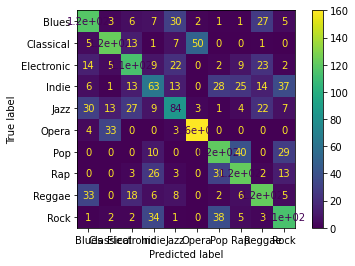

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(best1, X_test, y_test)
plt.show()

Grid Random Forest

In [ ]:
#grid random forest
from sklearn.model_selection import GridSearchCV, KFold

cv2 = KFold(n_splits=5, shuffle=True, random_state=42)

param = {'max_features':['auto','sqrt','log2'], 'n_estimators':range(90,200,5)}

gs2 = GridSearchCV(rfc, param_grid=param, cv=cv2, scoring = 'accuracy')
gs2.fit(X_train, y_train)
print(gs2.best_estimator_)
print(gs2.best_score_)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=170,
                       n_jobs=None, oob_score=False, random_state=42, verbose=0,
                       warm_start=False)
0.6403749999999999


In [ ]:
best2 = RandomForestClassifier(n_estimators=gs2.best_estimator_.n_estimators,max_features=gs2.best_estimator_.max_features)
best2.fit(X_train, y_train)
y_pred = best2.predict(X_test)

0.6365
              precision    recall  f1-score   support

       Blues      0.567     0.610     0.588       200
   Classical      0.818     0.720     0.766       200
  Electronic      0.638     0.625     0.631       200
       Indie      0.476     0.350     0.403       200
        Jazz      0.577     0.545     0.560       200
       Opera      0.858     0.910     0.883       200
         Pop      0.559     0.710     0.626       200
         Rap      0.630     0.655     0.642       200
      Reggae      0.678     0.610     0.642       200
        Rock      0.565     0.630     0.596       200

    accuracy                          0.636      2000
   macro avg      0.637     0.637     0.634      2000
weighted avg      0.637     0.636     0.634      2000



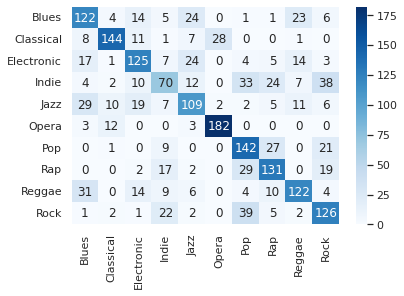

In [ ]:
print(acc(y_pred, y_test))
print(report(y_test, y_pred, digits=3))

from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_test, y_pred)

labels = ['Blues', 'Classical', 'Electronic', 'Indie', 'Jazz', 'Opera', 'Pop', 'Rap', 'Reggae','Rock']
sns.heatmap(cf_matrix, annot=True, fmt='g', cmap='Blues', xticklabels=labels, yticklabels=labels)

Grid svm

In [ ]:
#grid svm 
from sklearn.model_selection import GridSearchCV, KFold

cv3 = KFold(n_splits=5, shuffle=True, random_state=42)

param = {'C': [0.1, 1, 10, 100, 1000], 'gamma': ['scale', 'auto'], 'kernel': ['rbf', 'linear', 'sigmoid']}

gs3 = GridSearchCV(clf, param_grid=param, cv=cv3, scoring = 'accuracy')
gs3.fit(X_train, y_train)
print(gs3.best_estimator_)
print(gs3.best_score_)

SVC(C=10, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)
0.609


In [ ]:
best3 = svm.SVC(C=gs3.best_estimator_.C,gamma=gs3.best_estimator_.gamma, kernel=gs3.best_estimator_.kernel)
best3.fit(X_train, y_train)
y_pred = best3.predict(X_test)

SVM grid accuracy 0.6095
              precision    recall  f1-score   support

       Blues      0.594     0.695     0.641       200
   Classical      0.763     0.660     0.708       200
  Electronic      0.659     0.570     0.611       200
       Indie      0.409     0.440     0.424       200
        Jazz      0.548     0.460     0.500       200
       Opera      0.804     0.860     0.831       200
         Pop      0.539     0.615     0.575       200
         Rap      0.613     0.595     0.604       200
      Reggae      0.649     0.630     0.640       200
        Rock      0.551     0.570     0.560       200

    accuracy                          0.610      2000
   macro avg      0.613     0.610     0.609      2000
weighted avg      0.613     0.610     0.609      2000



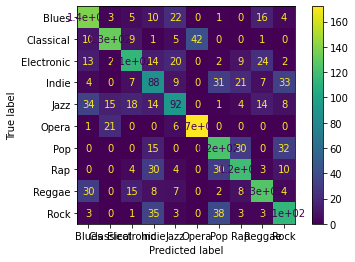

In [ ]:
print('SVM grid accuracy',acc(y_pred, y_test))
print(report(y_test, y_pred, digits=3))
plot_confusion_matrix(best3, X_test, y_test)
plt.show()

In [ ]:
X_train_cp=X_train
X_test_cp=X_test
y_train_cp=y_train
y_test_cp=y_test

In [ ]:
#grid xgboost
from sklearn.model_selection import GridSearchCV, KFold

cv4 = KFold(n_splits=5, shuffle=True, random_state=42)

param_grid = {
                    'eval_metric':['error', 'logloss'],
                    'n_estimators':[256, 512, 1024],
                    'max_depth':[3, 4, 5],
                   # 'learning_rate': [0.5, 0.05, 0.005],
                    'sampling_method': ["uniform", "gradient_based"]}
gs4 = GridSearchCV(xgbc, param_grid=param, cv=cv2, scoring = 'accuracy')
gs4.fit(X_train_cp, y_train_cp)
print(gs4.best_estimator_)
print(gs4.best_score_)

In [ ]:
best4 = xgboost.XGBClassifier(use_label_encoder=True,
                    eval_metric=gs4.best_estimator_.eva,
                    n_estimators=gs4.best_estimator_.n_estimators,
                    max_depth=gs4.best_estimator_.max_depth,
                   # learning_rate=gs4.best_estimator_.learning_rate,
                    sampling_method=gs4.best_estimator_.sampling_method
                    ) 
best4.fit(X_train_cp, y_train_cp)
y_pred = best4.predict(X_test_cp)

SyntaxError: ignored

In [ ]:
import xgboost

xgbc = xgboost.XGBClassifier(use_label_encoder=True,
                    eval_metric='error',
                    n_estimators=512,
                    max_depth=5,
                    learning_rate=0.5
                    ) 

xgbc.fit(X_train_cp,  y_train_cp)
y_pred=xgbc.predict(X_test_cp)

xgboost accuracy  0.625
              precision    recall  f1-score   support

       Blues      0.568     0.650     0.606       200
   Classical      0.834     0.730     0.779       200
  Electronic      0.696     0.630     0.661       200
       Indie      0.405     0.405     0.405       200
        Jazz      0.574     0.505     0.537       200
       Opera      0.840     0.890     0.864       200
         Pop      0.536     0.625     0.577       200
         Rap      0.649     0.665     0.657       200
      Reggae      0.647     0.605     0.625       200
        Rock      0.540     0.545     0.542       200

    accuracy                          0.625      2000
   macro avg      0.629     0.625     0.625      2000
weighted avg      0.629     0.625     0.625      2000



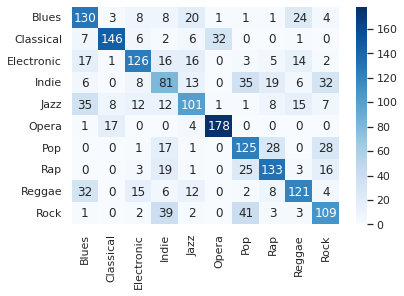

In [ ]:
print('xgboost accuracy ', acc(y_test_cp, y_pred))
print(report(y_test_cp, y_pred, digits=3))

from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_test_cp, y_pred)

labels = ['Blues', 'Classical', 'Electronic', 'Indie', 'Jazz', 'Opera', 'Pop', 'Rap', 'Reggae','Rock']
sns.heatmap(cf_matrix, annot=True, fmt='g', cmap='Blues', xticklabels=labels, yticklabels=labels)

### Import new features

In [814]:
import pandas as pd
import numpy as np
import seaborn as sns

In [815]:
df = pd.read_csv("10000-10genres-AllFeatures.csv")

In [816]:
df.head(5)

,Unnamed: 0,index,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,AudioSegments,SegDuration,SegConfidence,SegLoudnessStart,SegLoudnessMaxTime,SegLoudnessMax,SegLoudnessEnd,SegPitches0,SegPitches1,SegPitches2,SegPitches3,SegPitches4,SegPitches5,SegPitches6,SegPitches7,SegPitches8,SegPitches9,SegPitches10,SegPitches11,SegTimbre0,SegTimbre1,SegTimbre2,SegTimbre3,SegTimbre4,SegTimbre5,SegTimbre6,SegTimbre7,SegTimbre8,SegTimbre9,SegTimbre10,SegTimbre11,ReleaseDate,AlbumName,ArtistId,TotalTracks,Followers,ArtistPopularity,ArtistGenres
0,0,154380,Rock,Morgan Wallen,Happy Hour,2woGHWgrFfjXAgdUsitbqr,54,0.1600,0.616,199840,0.836,0.000000,G,0.0985,-4.278,Major,0.0354,97.955,4/4,0.795,734.0,0.23129,0.917,-14.671,0.02685,-3.355,0.0,0.527,0.718,0.653,0.676,0.851,0.850,1.000,0.859,0.361,0.308,0.291,0.367,54.199,64.287,-3.145,-13.947,-16.138,-6.436,-40.353,2.947,-8.357,-1.499,4.901,-29.068,2018-04-27,If I Know Me,4oUHIQIBe0LHzYfvXNW4QM,14.0,2400317.0,84.0,contemporary country
1,1,154398,Rock,Blackberry Smoke,One Horse Town,5Y36csDNfP9gRThyyveiBT,51,0.2810,0.599,256147,0.734,0.000000,C,0.1190,-4.615,Major,0.0355,118.928,4/4,0.243,778.0,0.35973,0.165,-12.308,0.22754,-8.566,0.0,0.216,0.149,0.020,0.130,0.958,0.182,0.036,0.067,0.075,1.000,0.097,0.084,50.193,-9.332,-4.285,-31.956,17.356,-41.447,3.679,11.261,-19.436,4.626,1.775,7.221,2012-08-14,The Whippoorwill,5P1oS9DUTPEqcrmXDmX4p8,13.0,246205.0,58.0,"country rock,modern southern rock,rock,souther..."
2,2,223373,Rock,Queen,Innuendo - Remastered 2011,4bmak6Hd7NPwVrY26TjKNT,56,0.1650,0.265,393027,0.739,0.005300,C#,0.3310,-5.542,Major,0.0479,148.376,4/4,0.227,1269.0,0.38290,0.460,-11.701,0.02095,-6.369,0.0,0.148,0.099,0.072,0.237,0.080,0.161,0.242,0.306,1.000,0.217,0.153,0.091,51.570,1.643,-14.198,-27.329,-8.177,-38.920,-8.027,-16.697,16.246,12.360,3.733,-22.369,1991-02-05,Innuendo (Deluxe Remastered Version),1dfeR4HaWDbWqFHLkxsg1d,17.0,37342764.0,88.0,"classic rock,glam rock,rock"
3,3,154389,Rock,Dierks Bentley,The Mountain,0vF1odB4L0mw7GzbAehrBR,54,0.0253,0.471,284440,0.839,0.000043,A#,0.3670,-5.455,Minor,0.0762,147.980,4/4,0.585,808.0,0.20118,0.748,-18.227,0.02228,-8.191,0.0,0.668,0.451,0.544,0.451,0.149,0.248,0.195,0.595,1.000,0.415,0.216,0.217,45.361,-30.926,-69.539,19.508,-14.008,-36.232,8.672,-29.146,-1.714,23.469,16.993,-7.049,2018-06-08,The Mountain,7x8nK0m0cP2ksQf0mjWdPS,13.0,2627380.0,72.0,"contemporary country,country,country road"
4,4,166574,Rock,U2,I Still Haven't Found What I'm Looking For,6wpGqhRvJGNNXwWlPmkMyO,76,0.0157,0.566,277477,0.783,0.003000,C#,0.0806,-9.412,Major,0.0363,100.864,4/4,0.587,1352.0,0.12776,0.353,-31.288,0.03778,-27.504,0.0,1.000,0.512,0.051,0.040,0.032,0.067,0.156,0.075,0.509,0.327,0.776,0.222,30.765,11.111,27.395,2.344,7.294,-33.576,26.559,-6.329,27.683,8.018,-4.341,-11.710,1987-03-03,The Joshua Tree (Super Deluxe),51Blml2LZPmy7TTiAg47vQ,49.0,8889070.0,80.0,"irish rock,permanent wave,rock"


In [817]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 58 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Unnamed: 0          10000 non-null  int64  
 1   index               10000 non-null  int64  
 2   genre               10000 non-null  object 
 3   artist_name         10000 non-null  object 
 4   track_name          10000 non-null  object 
 5   track_id            10000 non-null  object 
 6   popularity          10000 non-null  int64  
 7   acousticness        10000 non-null  float64
 8   danceability        10000 non-null  float64
 9   duration_ms         10000 non-null  int64  
 10  energy              10000 non-null  float64
 11  instrumentalness    10000 non-null  float64
 12  key                 10000 non-null  object 
 13  liveness            10000 non-null  float64
 14  loudness            10000 non-null  float64
 15  mode                10000 non-null  object 
 16  speec

In [818]:
len(df)

10000

###Preprocessing

In [819]:
#Check NA values
print(df.isna().sum().sum())
df.dropna(inplace=True)
print(df.isna().sum().sum())

594
0


In [820]:
#drop duplicates
df=df.drop_duplicates(subset=['track_name', 'artist_name'])

In [821]:
len(df)

9436

In [824]:
# keep columns where there are more than 1 unique values
df = df[[col for col in df if df[col].nunique() > 1]]

In [825]:
df.duration_ms=df.duration_ms*0.001

In [826]:
#let's consider year of release instead of date
df['ReleaseDate']=df['ReleaseDate'].apply(lambda x: pd.to_datetime(x).year)

In [829]:
df.head(3)

,Unnamed: 0,index,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,AudioSegments,SegDuration,SegConfidence,SegLoudnessStart,SegLoudnessMaxTime,SegLoudnessMax,SegLoudnessEnd,SegPitches0,SegPitches1,SegPitches2,SegPitches3,SegPitches4,SegPitches5,SegPitches6,SegPitches7,SegPitches8,SegPitches9,SegPitches10,SegPitches11,SegTimbre0,SegTimbre1,SegTimbre2,SegTimbre3,SegTimbre4,SegTimbre5,SegTimbre6,SegTimbre7,SegTimbre8,SegTimbre9,SegTimbre10,SegTimbre11,ReleaseDate,TotalTracks,Followers,ArtistPopularity
0,0,154380,Rock,Morgan Wallen,Happy Hour,2woGHWgrFfjXAgdUsitbqr,54,0.160,0.616,199.840,0.836,0.0000,G,0.0985,-4.278,Major,0.0354,97.955,4/4,0.795,734.0,0.23129,0.917,-14.671,0.02685,-3.355,0.0,0.527,0.718,0.653,0.676,0.851,0.850,1.000,0.859,0.361,0.308,0.291,0.367,54.199,64.287,-3.145,-13.947,-16.138,-6.436,-40.353,2.947,-8.357,-1.499,4.901,-29.068,2018,14.0,2400317.0,84.0
1,1,154398,Rock,Blackberry Smoke,One Horse Town,5Y36csDNfP9gRThyyveiBT,51,0.281,0.599,256.147,0.734,0.0000,C,0.1190,-4.615,Major,0.0355,118.928,4/4,0.243,778.0,0.35973,0.165,-12.308,0.22754,-8.566,0.0,0.216,0.149,0.020,0.130,0.958,0.182,0.036,0.067,0.075,1.000,0.097,0.084,50.193,-9.332,-4.285,-31.956,17.356,-41.447,3.679,11.261,-19.436,4.626,1.775,7.221,2012,13.0,246205.0,58.0
2,2,223373,Rock,Queen,Innuendo - Remastered 2011,4bmak6Hd7NPwVrY26TjKNT,56,0.165,0.265,393.027,0.739,0.0053,C#,0.3310,-5.542,Major,0.0479,148.376,4/4,0.227,1269.0,0.38290,0.460,-11.701,0.02095,-6.369,0.0,0.148,0.099,0.072,0.237,0.080,0.161,0.242,0.306,1.000,0.217,0.153,0.091,51.570,1.643,-14.198,-27.329,-8.177,-38.920,-8.027,-16.697,16.246,12.360,3.733,-22.369,1991,17.0,37342764.0,88.0


In [ ]:
df.drop(['AlbumName','ArtistId','ArtistGenres'], axis=1, inplace=True)

Get rid of too short and to long tracks

In [831]:
df=df[(df.duration_ms < df.duration_ms.quantile(.95)) & (df.duration_ms > df.duration_ms.quantile(.05))]

In [832]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.figure_factory as ff
import plotly.express as px


In [ ]:
features = ['ArtistPopularity', 'ReleaseDate', 'Followers']
# plotting of 4 first variables
fig = make_subplots(cols=3, rows=1, subplot_titles=features)

for i, feature in enumerate(features):
       fig.add_trace(go.Histogram(x=df[feature], name=feature), row=i//3 + 1, col=i%3 + 1)

width = 1000
height = 600

fig.update_layout(width=width, height=height, title='feature distribution')

fig.show()

#fig.write_image(os.path.join('images', fig.layout['title']['text'] + '.png'))

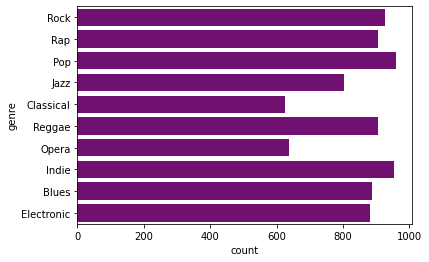

In [ ]:
sns.countplot(y="genre", data=df, color='purple')

In [833]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

def scale_col(i, dset):
    scaler = StandardScaler()
    scaler.fit(dset[i].values.reshape(-1, 1))
    dset[i]=scaler.transform(dset[i].values.reshape(-1, 1)) 

In [834]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8492 entries, 0 to 9999
Data columns (total 55 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Unnamed: 0          8492 non-null   int64  
 1   index               8492 non-null   int64  
 2   genre               8492 non-null   object 
 3   artist_name         8492 non-null   object 
 4   track_name          8492 non-null   object 
 5   track_id            8492 non-null   object 
 6   popularity          8492 non-null   int64  
 7   acousticness        8492 non-null   float64
 8   danceability        8492 non-null   float64
 9   duration_ms         8492 non-null   float64
 10  energy              8492 non-null   float64
 11  instrumentalness    8492 non-null   float64
 12  key                 8492 non-null   object 
 13  liveness            8492 non-null   float64
 14  loudness            8492 non-null   float64
 15  mode                8492 non-null   object 
 16  speech

In [835]:
df.columns

Index(['Unnamed: 0', 'index', 'genre', 'artist_name', 'track_name', 'track_id',
       'popularity', 'acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'key', 'liveness', 'loudness', 'mode',
       'speechiness', 'tempo', 'time_signature', 'valence', 'AudioSegments',
       'SegDuration', 'SegConfidence', 'SegLoudnessStart',
       'SegLoudnessMaxTime', 'SegLoudnessMax', 'SegLoudnessEnd', 'SegPitches0',
       'SegPitches1', 'SegPitches2', 'SegPitches3', 'SegPitches4',
       'SegPitches5', 'SegPitches6', 'SegPitches7', 'SegPitches8',
       'SegPitches9', 'SegPitches10', 'SegPitches11', 'SegTimbre0',
       'SegTimbre1', 'SegTimbre2', 'SegTimbre3', 'SegTimbre4', 'SegTimbre5',
       'SegTimbre6', 'SegTimbre7', 'SegTimbre8', 'SegTimbre9', 'SegTimbre10',
       'SegTimbre11', 'ReleaseDate', 'TotalTracks', 'Followers',
       'ArtistPopularity'],
      dtype='object')

In [836]:
numerical=['popularity', 'acousticness', 'danceability', 'duration_ms','energy', 'instrumentalness', 'liveness',
           'loudness', 'speechiness','tempo', 'valence', 'AudioSegments',
           'SegDuration', 'SegConfidence', 'SegLoudnessStart',
           'SegLoudnessMaxTime', 'SegLoudnessMax', 'SegLoudnessEnd', 'SegPitches0',
           'SegPitches1', 'SegPitches2', 'SegPitches3', 'SegPitches4',
            'SegPitches5', 'SegPitches6', 'SegPitches7', 'SegPitches8',
            'SegPitches9', 'SegPitches10', 'SegPitches11', 'SegTimbre0',
            'SegTimbre1', 'SegTimbre2', 'SegTimbre3', 'SegTimbre4', 'SegTimbre5',
            'SegTimbre6', 'SegTimbre7', 'SegTimbre8', 'SegTimbre9', 'SegTimbre10',
            'SegTimbre11', 'ReleaseDate', 'TotalTracks', 'Followers',
            'ArtistPopularity'
           ]
for j in numerical:
    scale_col(j, df)

In [837]:
df.head(3)

,Unnamed: 0,index,genre,artist_name,track_name,track_id,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,time_signature,valence,AudioSegments,SegDuration,SegConfidence,SegLoudnessStart,SegLoudnessMaxTime,SegLoudnessMax,SegLoudnessEnd,SegPitches0,SegPitches1,SegPitches2,SegPitches3,SegPitches4,SegPitches5,SegPitches6,SegPitches7,SegPitches8,SegPitches9,SegPitches10,SegPitches11,SegTimbre0,SegTimbre1,SegTimbre2,SegTimbre3,SegTimbre4,SegTimbre5,SegTimbre6,SegTimbre7,SegTimbre8,SegTimbre9,SegTimbre10,SegTimbre11,ReleaseDate,TotalTracks,Followers,ArtistPopularity
0,0,154380,Rock,Morgan Wallen,Happy Hour,2woGHWgrFfjXAgdUsitbqr,0.511876,-0.544733,0.302990,-0.583056,1.032484,-0.525157,G,-0.571767,0.866030,Major,-0.544183,-0.671859,4/4,1.287296,-0.478536,-0.209171,1.209450,0.475521,-0.588164,0.825990,0.034294,0.303020,0.829654,0.987003,1.336780,1.664802,1.799680,2.360757,1.707937,0.185010,-0.059578,0.024699,0.197091,0.980474,0.653760,-0.155320,-0.252800,-1.179461,0.487290,-1.308122,0.153566,-0.104862,-0.111474,0.842878,-1.822049,0.721749,-0.036788,-0.093569,1.437199
1,1,154398,Rock,Blackberry Smoke,One Horse Town,5Y36csDNfP9gRThyyveiBT,0.343854,-0.207814,0.210221,0.295489,0.646839,-0.525157,C,-0.446430,0.811944,Major,-0.543067,0.014330,4/4,-0.848832,-0.318777,0.326238,-1.298119,0.709255,2.755678,0.282443,0.034294,-0.623250,-0.843292,-1.056509,-0.609276,2.012314,-0.457780,-0.958896,-0.862943,-0.798166,2.177091,-0.662374,-0.740074,0.556569,-0.371278,-0.175432,-0.647534,-0.180384,-0.653369,0.272884,0.499600,-0.688344,0.231430,0.676372,0.484870,0.317837,-0.083298,-0.373480,-0.272621
2,2,223373,Rock,Queen,Innuendo - Remastered 2011,4bmak6Hd7NPwVrY26TjKNT,0.623891,-0.530811,-1.612416,2.431196,0.665743,-0.507716,C#,0.849735,0.663167,Major,-0.404729,0.977801,4/4,-0.910749,1.463996,0.422823,-0.314431,0.769295,-0.686468,0.511607,0.034294,-0.825778,-0.990299,-0.888638,-0.227906,-0.839230,-0.528748,-0.249509,-0.087134,2.381687,-0.353707,-0.464043,-0.716893,0.702280,-0.218467,-0.350319,-0.546116,-0.941996,-0.571039,-0.147430,-0.664031,1.190869,0.664414,0.780665,-1.396189,-1.095854,0.102741,4.446934,1.700249


In [838]:
df['time_signature'].value_counts()

4/4    7482
3/4     778
5/4     153
1/4      79
Name: time_signature, dtype: int64

In [839]:
df['mode'].value_counts()

Major    5510
Minor    2982
Name: mode, dtype: int64

In [840]:
df_cp = df

In [841]:
df=df[numerical]

#one-hot encoding of categoriacal features

#As modes are very correlating features we will make one column (not two by ohe)
#tab1=pd.get_dummies(df_cp['mode'])
mode_dict = {'Major' : 1, 'Minor' : 0}
tab1 = df_cp['mode'].replace(mode_dict)

#ohe of key feature
tab2=pd.get_dummies(df_cp['key'])


df=pd.concat([df, tab1, tab2, df_cp['genre']],axis=1)

df['time_signature'] = df_cp['time_signature'].apply(lambda x : int(x[0]))

df.head()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,AudioSegments,SegDuration,SegConfidence,SegLoudnessStart,SegLoudnessMaxTime,SegLoudnessMax,SegLoudnessEnd,SegPitches0,SegPitches1,SegPitches2,SegPitches3,SegPitches4,SegPitches5,SegPitches6,SegPitches7,SegPitches8,SegPitches9,SegPitches10,SegPitches11,SegTimbre0,SegTimbre1,SegTimbre2,SegTimbre3,SegTimbre4,SegTimbre5,SegTimbre6,SegTimbre7,SegTimbre8,SegTimbre9,SegTimbre10,SegTimbre11,ReleaseDate,TotalTracks,Followers,ArtistPopularity,mode,A,A#,B,C,C#,D,D#,E,F,F#,G,G#,genre,time_signature
0,0.511876,-0.544733,0.302990,-0.583056,1.032484,-0.525157,-0.571767,0.866030,-0.544183,-0.671859,1.287296,-0.478536,-0.209171,1.209450,0.475521,-0.588164,0.825990,0.034294,0.303020,0.829654,0.987003,1.336780,1.664802,1.799680,2.360757,1.707937,0.185010,-0.059578,0.024699,0.197091,0.980474,0.653760,-0.155320,-0.252800,-1.179461,0.487290,-1.308122,0.153566,-0.104862,-0.111474,0.842878,-1.822049,0.721749,-0.036788,-0.093569,1.437199,1,0,0,0,0,0,0,0,0,0,0,1,0,Rock,4
1,0.343854,-0.207814,0.210221,0.295489,0.646839,-0.525157,-0.446430,0.811944,-0.543067,0.014330,-0.848832,-0.318777,0.326238,-1.298119,0.709255,2.755678,0.282443,0.034294,-0.623250,-0.843292,-1.056509,-0.609276,2.012314,-0.457780,-0.958896,-0.862943,-0.798166,2.177091,-0.662374,-0.740074,0.556569,-0.371278,-0.175432,-0.647534,-0.180384,-0.653369,0.272884,0.499600,-0.688344,0.231430,0.676372,0.484870,0.317837,-0.083298,-0.373480,-0.272621,1,0,0,0,1,0,0,0,0,0,0,0,0,Rock,4
2,0.623891,-0.530811,-1.612416,2.431196,0.665743,-0.507716,0.849735,0.663167,-0.404729,0.977801,-0.910749,1.463996,0.422823,-0.314431,0.769295,-0.686468,0.511607,0.034294,-0.825778,-0.990299,-0.888638,-0.227906,-0.839230,-0.528748,-0.249509,-0.087134,2.381687,-0.353707,-0.464043,-0.716893,0.702280,-0.218467,-0.350319,-0.546116,-0.941996,-0.571039,-0.147430,-0.664031,1.190869,0.664414,0.780665,-1.396189,-1.095854,0.102741,4.446934,1.700249,1,0,0,0,0,1,0,0,0,0,0,0,0,Rock,4
3,0.511876,-0.919799,-0.488275,0.736938,1.043826,-0.525015,1.069839,0.677130,-0.089005,0.964845,0.474638,-0.209850,-0.334686,0.645914,0.123782,-0.664308,0.321558,0.034294,0.722969,0.044634,0.635119,0.534834,-0.615133,-0.234738,-0.411360,0.850977,2.381687,0.286265,-0.240922,-0.299640,0.045257,-0.671943,-1.326656,0.480489,-1.115926,-0.483464,0.452162,-1.182166,0.244995,1.286345,1.486955,-0.422285,0.721749,-0.083298,-0.064064,0.648052,0,0,1,0,0,0,0,0,0,0,0,0,0,Rock,4
4,1.744041,-0.946530,0.030140,0.628296,0.832099,-0.515285,-0.681207,0.042062,-0.534142,-0.576683,0.482378,1.765361,-0.640741,-0.671226,-1.168135,-0.406051,-1.692937,0.034294,1.711785,0.223983,-0.956432,-0.930054,-0.995123,-0.846415,-0.545661,-0.836974,0.693786,0.001833,1.742381,-0.283082,-1.499258,-0.086639,0.383473,0.104277,-0.480519,-0.396932,1.094410,-0.232508,1.793205,0.421330,0.350605,-0.718588,-1.365128,1.591049,0.749594,1.174150,1,0,0,0,0,1,0,0,0,0,0,0,0,Rock,4


Let's build heatmap

In [842]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

def corr_heatmap(data):
    corr_matrix = data.corr()
    mask = np.zeros_like(corr_matrix, dtype=np.bool)
    mask[np.triu_indices_from(mask)]= True
    f, ax = plt.subplots(figsize=(66, 90)) 
    sns.set(font_scale=4)
    heatmap = sns.heatmap(corr_matrix, 
                          mask = mask,
                          square = True,
                          linewidths = 1.5,
                          cmap = 'coolwarm',
                          cbar_kws = {'shrink': .4, 
                                   'ticks' : [-1, -.5, 0, 0.5, 1]},
                          vmin = -1, 
                          vmax = 1,
                          annot = True,
                          annot_kws = {'size': 15})#add the column names as labels
    ax.set_yticklabels(corr_matrix.columns, rotation = 0)
    ax.set_xticklabels(corr_matrix.columns)
    sns.set_style({'xtick.bottom': True}, {'ytick.left': True})


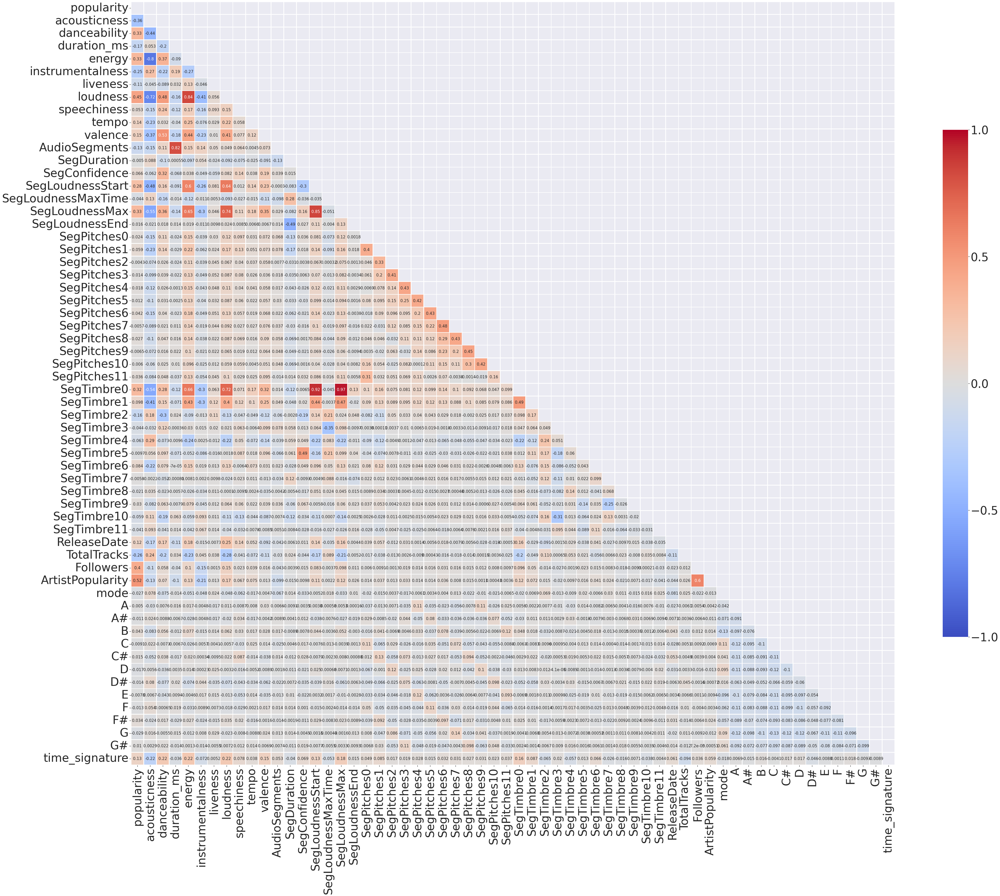

In [ ]:
corr_heatmap(df)

As 'loudness','SegLoudnessStart', 'SegLoudnessMax', 'SegTimbre0', 'SegTimbre1', 'SegTimbre2'   features 
are very correlating with others, let's drop it

In [843]:
df=df.drop(columns=['loudness','SegLoudnessStart', 'SegLoudnessMax', 'SegTimbre0', 'SegTimbre1', 'SegTimbre2'], axis=1)

In [844]:
df.head(1)

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,speechiness,tempo,valence,AudioSegments,SegDuration,SegConfidence,SegLoudnessMaxTime,SegLoudnessEnd,SegPitches0,SegPitches1,SegPitches2,SegPitches3,SegPitches4,SegPitches5,SegPitches6,SegPitches7,SegPitches8,SegPitches9,SegPitches10,SegPitches11,SegTimbre3,SegTimbre4,SegTimbre5,SegTimbre6,SegTimbre7,SegTimbre8,SegTimbre9,SegTimbre10,SegTimbre11,ReleaseDate,TotalTracks,Followers,ArtistPopularity,mode,A,A#,B,C,C#,D,D#,E,F,F#,G,G#,genre,time_signature
0,0.511876,-0.544733,0.30299,-0.583056,1.032484,-0.525157,-0.571767,-0.544183,-0.671859,1.287296,-0.478536,-0.209171,1.20945,-0.588164,0.034294,0.30302,0.829654,0.987003,1.33678,1.664802,1.79968,2.360757,1.707937,0.18501,-0.059578,0.024699,0.197091,-0.2528,-1.179461,0.48729,-1.308122,0.153566,-0.104862,-0.111474,0.842878,-1.822049,0.721749,-0.036788,-0.093569,1.437199,1,0,0,0,0,0,0,0,0,0,0,1,0,Rock,4


In [845]:
df.shape

(8492, 55)

# Fitting of best models from first iteration

In [846]:
from sklearn.model_selection import train_test_split
X = df.drop(columns=['genre'], axis=1)
y = df['genre']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=True, stratify=y)

In [847]:
X_train.shape

(6793, 54)

Logistic_regr

In [852]:
best1 = LogisticRegression(C = gs1.best_estimator_.C, max_iter=5000 )
best1.fit(X_train, y_train)
y_pred = best1.predict(X_test)

In [853]:
print('Grid logreg accuracy',acc(y_pred, y_test))
print(report(y_test, y_pred, digits=3))

Grid logreg accuracy 0.646262507357269
              precision    recall  f1-score   support

       Blues      0.598     0.638     0.617       177
   Classical      0.688     0.600     0.641       125
  Electronic      0.646     0.599     0.622       177
       Indie      0.568     0.702     0.628       191
        Jazz      0.542     0.441     0.486       161
       Opera      0.810     0.898     0.852       128
         Pop      0.667     0.594     0.628       192
         Rap      0.702     0.687     0.694       182
      Reggae      0.596     0.619     0.607       181
        Rock      0.696     0.719     0.707       185

    accuracy                          0.646      1699
   macro avg      0.651     0.650     0.648      1699
weighted avg      0.646     0.646     0.644      1699



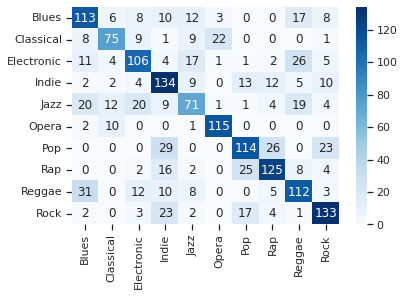

In [854]:
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_test, y_pred)

labels = ['Blues', 'Classical', 'Electronic', 'Indie', 'Jazz', 'Opera', 'Pop', 'Rap', 'Reggae','Rock']
sns.heatmap(cf_matrix, annot=True, fmt='g', cmap='Blues', xticklabels=labels, yticklabels=labels)

Random Forest Best

In [ ]:
best2 = RandomForestClassifier(n_estimators=gs2.best_estimator_.n_estimators,max_features=gs2.best_estimator_.max_features)
best2.fit(X_train, y_train)
y_pred = best2.predict(X_test)

In [ ]:
sns.set(font_scale=1)

0.7039434961742201
              precision    recall  f1-score   support

       Blues      0.627     0.655     0.641       177
   Classical      0.871     0.704     0.779       125
  Electronic      0.726     0.718     0.722       177
       Indie      0.586     0.675     0.628       191
        Jazz      0.638     0.503     0.562       161
       Opera      0.874     0.977     0.923       128
         Pop      0.702     0.688     0.695       192
         Rap      0.718     0.742     0.730       182
      Reggae      0.674     0.641     0.657       181
        Rock      0.735     0.795     0.764       185

    accuracy                          0.704      1699
   macro avg      0.715     0.710     0.710      1699
weighted avg      0.705     0.704     0.702      1699



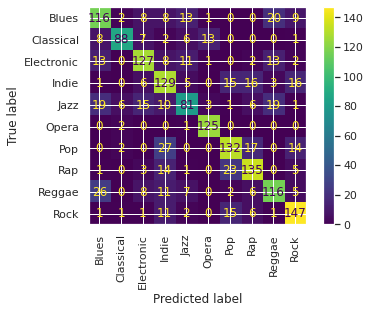

In [ ]:
print(acc(y_pred, y_test))
print(report(y_test, y_pred, digits=3))

import matplotlib.pyplot as plt
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(best2, X_test, y_test, values_format='g', xticks_rotation='vertical')
plt.show()

[[116   2   8   8  13   1   0   0  20   9]
 [  8  88   7   2   6  13   0   0   0   1]
 [ 13   0 127   8  11   1   0   2  13   2]
 [  1   0   6 129   5   0  15  16   3  16]
 [ 19   6  15  10  81   3   1   6  19   1]
 [  0   2   0   0   1 125   0   0   0   0]
 [  0   2   0  27   0   0 132  17   0  14]
 [  1   0   3  14   1   0  23 135   0   5]
 [ 26   0   8  11   7   0   2   6 116   5]
 [  1   1   1  11   2   0  15   6   1 147]]


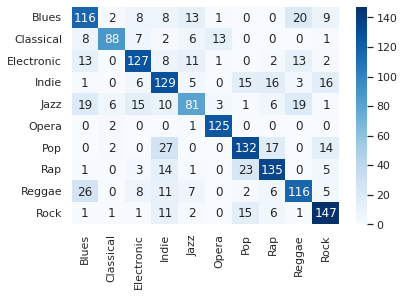

In [ ]:
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_test, y_pred)
print(cf_matrix)

labels = ['Blues', 'Classical', 'Electronic', 'Indie', 'Jazz', 'Opera', 'Pop', 'Rap', 'Reggae','Rock']
          #'Blues', 'Classical', 'Electronic', 'Indie', 'Jazz', 'Opera', 'Pop', 'Rap', 'Reggae','Rock']
#labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cf_matrix, annot=True, fmt='g', cmap='Blues', xticklabels=labels, yticklabels=labels)

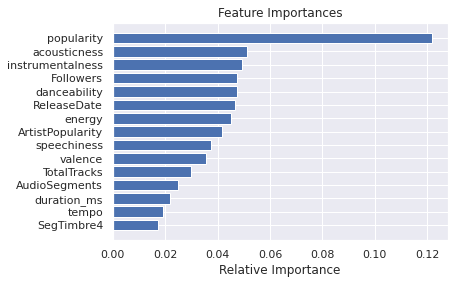

In [ ]:
features = X_train.columns
importances = best2.feature_importances_
indices = np.argsort(importances)

num_features=15
#plt.figure(figsize=(10,100))
plt.title('Feature Importances')
#plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.barh(range(num_features), importances[indices[-num_features:]], color='b', align='center')
plt.yticks(range(num_features), [features[i] for i in indices[-num_features:]])
plt.xlabel('Relative Importance')
plt.show()

SVM Best Model

In [ ]:
best3 = svm.SVC(C=gs3.best_estimator_.C,gamma=gs3.best_estimator_.gamma, kernel=gs3.best_estimator_.kernel)
best3.fit(X_train, y_train)
y_pred = best3.predict(X_test)

SVM grid accuracy 0.6291936433195998
              precision    recall  f1-score   support

       Blues      0.583     0.672     0.625       177
   Classical      0.706     0.576     0.634       125
  Electronic      0.654     0.588     0.619       177
       Indie      0.502     0.592     0.543       191
        Jazz      0.544     0.503     0.523       161
       Opera      0.803     0.891     0.844       128
         Pop      0.617     0.589     0.603       192
         Rap      0.672     0.676     0.674       182
      Reggae      0.611     0.608     0.609       181
        Rock      0.698     0.649     0.672       185

    accuracy                          0.629      1699
   macro avg      0.639     0.634     0.635      1699
weighted avg      0.632     0.629     0.629      1699



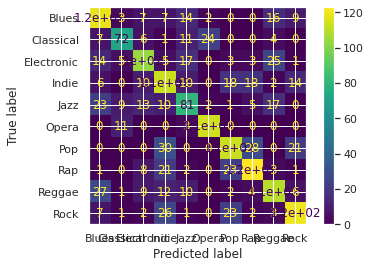

In [ ]:
print('SVM grid accuracy',acc(y_pred, y_test))
print(report(y_test, y_pred, digits=3))
plot_confusion_matrix(best3, X_test, y_test)
plt.show()

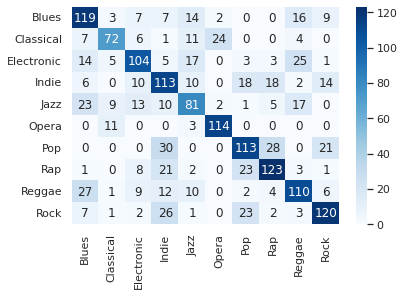

In [ ]:
cf_matrix = confusion_matrix(y_test, y_pred)

labels = ['Blues', 'Classical', 'Electronic', 'Indie', 'Jazz', 'Opera', 'Pop', 'Rap', 'Reggae','Rock']
sns.heatmap(cf_matrix, annot=True, fmt='g', cmap='Blues', xticklabels=labels, yticklabels=labels)

In [ ]:
X_train_cp2=X_train
X_test_cp2=X_test
y_train_cp2=y_train
y_test_cp2=y_test

In [856]:
import xgboost

xgbc = xgboost.XGBClassifier(use_label_encoder=False,
                    eval_metric='logloss',
                    n_estimators=512,
                    max_depth=5,
                    learning_rate=0.05,
                    scoring='f1'
                    ) 

xgbc.fit(X_train,  y_train)
y_pred=xgbc.predict(X_test)

xgboost accuracy  0.7504414361389052
              precision    recall  f1-score   support

       Blues      0.681     0.723     0.701       177
   Classical      0.894     0.808     0.849       125
  Electronic      0.785     0.723     0.753       177
       Indie      0.628     0.717     0.670       191
        Jazz      0.676     0.596     0.634       161
       Opera      0.930     0.938     0.934       128
         Pop      0.755     0.755     0.755       192
         Rap      0.738     0.791     0.764       182
      Reggae      0.705     0.685     0.695       181
        Rock      0.831     0.822     0.826       185

    accuracy                          0.750      1699
   macro avg      0.762     0.756     0.758      1699
weighted avg      0.753     0.750     0.751      1699



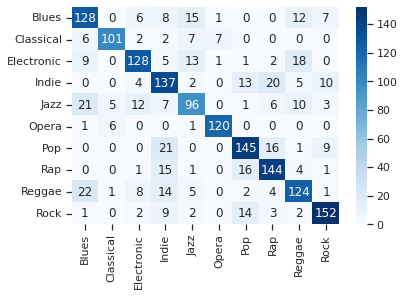

In [857]:
print('xgboost accuracy ', acc(y_test, y_pred))
print(report(y_test, y_pred, digits=3))

from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_test, y_pred)

labels = ['Blues', 'Classical', 'Electronic', 'Indie', 'Jazz', 'Opera', 'Pop', 'Rap', 'Reggae','Rock']
sns.heatmap(cf_matrix, annot=True, fmt='g', cmap='Blues', xticklabels=labels, yticklabels=labels)

### PCA 

In [ ]:
from sklearn.model_selection import train_test_split
X = df.drop(columns=['genre'], axis=1)
y = df['genre']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, shuffle=True, stratify=y)

In [ ]:
X_train.columns

Index(['popularity', 'acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'speechiness', 'tempo', 'valence',
       'AudioSegments', 'SegDuration', 'SegConfidence', 'SegLoudnessMaxTime',
       'SegLoudnessEnd', 'SegPitches0', 'SegPitches1', 'SegPitches2',
       'SegPitches3', 'SegPitches4', 'SegPitches5', 'SegPitches6',
       'SegPitches7', 'SegPitches8', 'SegPitches9', 'SegPitches10',
       'SegPitches11', 'SegTimbre3', 'SegTimbre4', 'SegTimbre5', 'SegTimbre6',
       'SegTimbre7', 'SegTimbre8', 'SegTimbre9', 'SegTimbre10', 'SegTimbre11',
       'ReleaseDate', 'TotalTracks', 'Followers', 'ArtistPopularity', 'mode',
       'A', 'A#', 'B', 'C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#',
       'time_signature'],
      dtype='object')

In [ ]:
group1=['AudioSegments',
           'SegDuration', 'SegConfidence',
           'SegLoudnessMaxTime', 'SegLoudnessEnd', 'SegPitches0',
           'SegPitches1', 'SegPitches2', 'SegPitches3', 'SegPitches4',
            'SegPitches5', 'SegPitches6', 'SegPitches7', 'SegPitches8',
            'SegPitches9', 'SegPitches10', 'SegPitches11', 'SegTimbre3', 'SegTimbre4', 'SegTimbre5',
            'SegTimbre6', 'SegTimbre7', 'SegTimbre8', 'SegTimbre9', 'SegTimbre10',
            'SegTimbre11']

group11=['SegPitches0',
           'SegPitches1', 'SegPitches2', 'SegPitches3', 'SegPitches4',
            'SegPitches5', 'SegPitches6', 'SegPitches7', 'SegPitches8',
            'SegPitches9', 'SegPitches10', 'SegPitches11']

group12=['SegTimbre3', 'SegTimbre4', 'SegTimbre5',
            'SegTimbre6', 'SegTimbre7', 'SegTimbre8', 'SegTimbre9', 'SegTimbre10',
            'SegTimbre11']

group2=['A', 'A#', 'B', 'C', 'C#', 'D', 'D#', 'E', 'F', 'F#', 'G', 'G#']

In [ ]:
len(group1)

26

In [ ]:
X_gr1=X_train[group1]
X_gr1.head()

,AudioSegments,SegDuration,SegConfidence,SegLoudnessMaxTime,SegLoudnessEnd,SegPitches0,SegPitches1,SegPitches2,SegPitches3,SegPitches4,SegPitches5,SegPitches6,SegPitches7,SegPitches8,SegPitches9,SegPitches10,SegPitches11,SegTimbre3,SegTimbre4,SegTimbre5,SegTimbre6,SegTimbre7,SegTimbre8,SegTimbre9,SegTimbre10,SegTimbre11
5274,4.695498,0.249495,1.486217,0.159781,0.034294,-0.968739,-0.875633,-0.943519,-0.965696,-0.988627,-0.897106,-1.058761,-1.044722,-0.942549,-0.298760,2.535702,-0.839420,0.083301,-2.025994,2.002750,-0.285416,0.181660,1.499489,-2.806564,-1.533953,-0.457694
9393,-0.703652,-0.350568,-0.934655,1.054183,0.034294,-0.891302,0.579742,-0.162271,-0.751844,-0.676841,-0.613234,0.036311,0.026478,0.628471,2.177091,0.789687,0.650771,-0.673222,0.516918,-0.362820,0.750863,0.354510,1.416699,0.337633,-0.324685,-0.390181
9442,0.661567,-0.202752,1.486217,0.519175,0.034294,-0.953847,-0.734506,-0.769191,-0.730458,-0.897689,-0.761929,0.380674,2.165632,-0.564404,-0.550870,-0.708415,-0.448659,-2.855467,-0.086812,0.642990,-0.022585,2.540345,0.398147,-1.068808,-1.256391,0.322765
4219,1.493043,0.358169,-0.497831,0.067309,0.034294,-1.049155,-0.884454,-1.020998,-0.940747,-0.520948,-0.988351,-1.013994,-0.966817,0.071567,2.177091,-0.262171,-0.703647,0.447742,-0.367260,0.050001,-0.938220,-0.046671,0.035544,-1.016910,-0.312061,-1.254235
3654,-0.482167,0.310731,1.442868,-0.357899,0.034294,-1.153398,-1.213751,-0.836985,2.491583,-0.488470,-1.012007,-1.041543,-0.914880,-0.970050,-0.954893,-0.938619,-0.991751,0.986723,-0.343307,1.637659,2.028752,-0.511324,0.705292,-1.543500,0.507896,-0.818458


In [ ]:
from sklearn import preprocessing

scaler = preprocessing.MinMaxScaler()

def scale_col(i, dset):
    scaler = preprocessing.MinMaxScaler()
    scaler.fit(dset[i].values.reshape(-1, 1))
    dset[i]=scaler.transform(dset[i].values.reshape(-1, 1)) 


In [ ]:
for dfs in [X_train]:
  for cols in X_train[group1]:
      scale_col(cols, dfs)

for dfs in [X_train]:
  for cols in X_train[group2]:
      scale_col(cols, dfs)

In [ ]:
X_train.head()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,speechiness,tempo,valence,AudioSegments,SegDuration,SegConfidence,SegLoudnessMaxTime,SegLoudnessEnd,SegPitches0,SegPitches1,SegPitches2,SegPitches3,SegPitches4,SegPitches5,SegPitches6,SegPitches7,SegPitches8,SegPitches9,SegPitches10,SegPitches11,SegTimbre3,SegTimbre4,SegTimbre5,SegTimbre6,SegTimbre7,SegTimbre8,SegTimbre9,SegTimbre10,SegTimbre11,ReleaseDate,TotalTracks,Followers,ArtistPopularity,mode,A,A#,B,C,C#,D,D#,E,F,F#,G,G#,time_signature
5274,-0.944319,-0.402726,-0.139027,3.244413,0.393523,-0.513245,4.242998,0.221141,-0.924080,1.360822,0.770809,0.033059,1.000000,0.061070,1.0,0.099099,0.137137,0.054054,0.029029,0.033033,0.051051,0.006006,0.010010,0.032032,0.233233,1.000000,0.053053,0.507190,0.239189,0.468405,0.460856,0.447381,0.680518,0.202916,0.495073,0.457645,-2.307589,0.567837,-0.352498,-0.009572,1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4
9393,0.791914,-0.964378,-1.290453,-0.571198,0.832099,-0.486656,-0.631073,-0.553108,-0.058435,-1.484253,0.195122,0.016121,0.273273,0.105654,1.0,0.125125,0.632633,0.296296,0.089089,0.129129,0.135135,0.324324,0.340340,0.489489,1.000000,0.506507,0.503504,0.436512,0.534327,0.281235,0.591099,0.461250,0.670993,0.524387,0.596444,0.465927,0.250518,0.009721,-0.328776,0.121953,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
9442,-0.384244,1.323636,-0.493732,0.470646,-1.081002,2.498977,-0.452544,-0.461626,1.794926,-0.210316,0.340689,0.020294,1.000000,0.078985,1.0,0.104104,0.185185,0.108108,0.095095,0.061061,0.091091,0.424424,1.000000,0.142142,0.155155,0.083083,0.171171,0.232639,0.464257,0.360817,0.493890,0.636634,0.553806,0.380589,0.518340,0.553381,0.385156,-0.222827,-0.358495,-0.141096,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,4
4219,-1.952454,1.713459,-1.345023,1.459534,-1.791799,-0.486656,2.971289,-0.089005,0.540398,-1.123588,0.429346,0.036127,0.404404,0.056461,1.0,0.072072,0.134134,0.030030,0.036036,0.177177,0.024024,0.019019,0.034034,0.327327,1.000000,0.209209,0.094094,0.541237,0.431707,0.313898,0.378810,0.429060,0.512088,0.385895,0.597502,0.359937,0.789067,2.800300,-0.316860,0.253478,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,5
3654,-0.104206,0.246052,1.268878,-0.542021,-0.430699,2.492395,-0.787591,-0.612236,-0.341835,0.285018,0.218738,0.034788,0.986987,0.035265,1.0,0.037037,0.022022,0.087087,1.000000,0.187187,0.017017,0.011011,0.050050,0.024024,0.030030,0.018018,0.007007,0.591590,0.434487,0.439518,0.751708,0.391778,0.589144,0.332055,0.666238,0.413392,0.452474,-0.129807,-0.400236,-1.522105,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,4


In [ ]:
from sklearn.decomposition import PCA

In [ ]:
ind1=X_train.index

In [ ]:
# PCA
pca = PCA(n_components=0.90)
df_pca = pca.fit_transform(X=X_gr1)

# Store as dataframe and print
df_pca = pd.DataFrame(df_pca, index=ind1)
print(df_pca.shape)  #> (3147, 784)
df_pca.round(2).head()

(6793, 20)


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
5274,1.90,-0.13,-1.30,-0.94,2.03,1.58,-1.80,-0.29,-2.56,-1.13,-1.31,0.50,4.51,1.72,-0.90,-1.62,-1.45,-1.20,1.78,-0.17
9393,-0.38,0.94,-1.41,-0.94,0.59,-1.12,0.76,-0.87,0.03,1.39,0.11,-1.20,0.53,-0.81,-0.19,0.54,-1.03,-0.38,-0.93,0.43
9442,1.11,1.72,-0.46,-2.28,-0.25,-0.04,-1.85,0.51,-1.37,-0.48,1.22,-0.53,0.32,1.30,-0.73,0.23,-0.07,1.25,0.58,2.25
4219,1.54,0.53,-2.09,0.38,0.18,0.09,0.12,-0.50,-1.15,-0.78,-1.71,-0.15,1.95,0.20,0.23,0.18,-0.21,-0.33,-1.29,-0.26
3654,2.15,-0.02,1.39,-0.84,-0.82,1.56,-1.50,0.29,-1.18,-0.19,-1.11,0.52,0.11,-1.63,-1.34,1.01,0.12,-1.64,1.71,-1.30


In [ ]:
X_gr1_test=X_test[group1]
ind_1t=X_gr1_test.index
X_gr1_test=pd.DataFrame(pca.transform(X_gr1_test), index=ind_1t)
X_gr1_test.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22
3422,1.778140,-0.138748,0.266829,-0.076229,-1.462997,-1.182961,-0.266573,-1.579441,-0.461059,1.596375,-1.030967,0.290799,-2.092285,0.933489,-0.146722,0.431587,0.036855,0.191352,-0.090131,1.253640,-0.373393,1.062155,-0.690898
1305,1.874547,1.399454,0.649084,-0.088993,-1.675705,-0.904506,-0.988700,-1.028797,-0.804592,0.305357,-0.660096,0.199977,0.400798,-0.065731,0.462154,2.490634,1.172514,0.727898,1.964288,0.175102,0.184578,-0.149020,0.582016
8236,0.512431,-0.449353,-0.014495,-2.073199,1.547720,0.460345,-0.024669,0.270371,2.254187,-1.417233,-0.771742,2.792620,-1.549014,-0.608812,-0.307740,-0.741385,-0.952797,-0.100203,0.583898,-0.381752,0.177378,-0.265265,0.124139
3845,-0.525905,1.131952,-0.861556,0.223799,-0.539297,2.370692,-1.332754,1.093322,-0.090091,-0.981016,1.697866,0.031431,0.792433,0.973922,1.253262,1.677034,-0.064699,0.687709,0.602565,0.533312,-0.178167,-0.264687,0.430242
1909,-1.775625,0.099862,-3.723419,1.039751,1.955817,1.398850,-0.294002,0.503062,-0.560025,-1.182659,-1.469819,-1.688625,1.204836,-0.759948,1.215634,0.872008,-0.063671,0.509891,0.743934,0.361344,-0.228986,0.045441,0.766867


#PCA group 11

In [ ]:
X_gr11=X_train[group11]
X_gr11.head()

,SegPitches0,SegPitches1,SegPitches2,SegPitches3,SegPitches4,SegPitches5,SegPitches6,SegPitches7,SegPitches8,SegPitches9,SegPitches10,SegPitches11
5274,-0.968739,-0.875633,-0.943519,-0.965696,-0.988627,-0.897106,-1.058761,-1.044722,-0.942549,-0.298760,2.535702,-0.839420
9393,-0.891302,0.579742,-0.162271,-0.751844,-0.676841,-0.613234,0.036311,0.026478,0.628471,2.177091,0.789687,0.650771
9442,-0.953847,-0.734506,-0.769191,-0.730458,-0.897689,-0.761929,0.380674,2.165632,-0.564404,-0.550870,-0.708415,-0.448659
4219,-1.049155,-0.884454,-1.020998,-0.940747,-0.520948,-0.988351,-1.013994,-0.966817,0.071567,2.177091,-0.262171,-0.703647
3654,-1.153398,-1.213751,-0.836985,2.491583,-0.488470,-1.012007,-1.041543,-0.914880,-0.970050,-0.954893,-0.938619,-0.991751


In [ ]:
from sklearn import preprocessing

scaler = preprocessing.MinMaxScaler()

def scale_col(i, dset):
    scaler = preprocessing.MinMaxScaler()
    scaler.fit(dset[i].values.reshape(-1, 1))
    dset[i]=scaler.transform(dset[i].values.reshape(-1, 1)) 


In [ ]:
for dfs in [X_train]:
  for cols in X_train[group11]:
      scale_col(cols, dfs)

for dfs in [X_train]:
  for cols in X_train[group12]:
      scale_col(cols, dfs)


for dfs in [X_train]:
  for cols in X_train[group2]:
      scale_col(cols, dfs)

In [ ]:
X_train.head()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,speechiness,tempo,valence,AudioSegments,SegDuration,SegConfidence,SegLoudnessMaxTime,SegLoudnessEnd,SegPitches0,SegPitches1,SegPitches2,SegPitches3,SegPitches4,SegPitches5,SegPitches6,SegPitches7,SegPitches8,SegPitches9,SegPitches10,SegPitches11,SegTimbre3,SegTimbre4,SegTimbre5,SegTimbre6,SegTimbre7,SegTimbre8,SegTimbre9,SegTimbre10,SegTimbre11,ReleaseDate,TotalTracks,Followers,ArtistPopularity,mode,A,A#,B,C,C#,D,D#,E,F,F#,G,G#,time_signature
5274,-0.944319,-0.402726,-0.139027,3.244413,0.393523,-0.513245,4.242998,0.221141,-0.924080,1.360822,4.695498,0.249495,1.486217,0.159781,0.034294,0.099099,0.137137,0.054054,0.029029,0.033033,0.051051,0.006006,0.010010,0.032032,0.233233,1.000000,0.053053,0.507190,0.239189,0.468405,0.460856,0.447381,0.680518,0.202916,0.495073,0.457645,-2.307589,0.567837,-0.352498,-0.009572,1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4
9393,0.791914,-0.964378,-1.290453,-0.571198,0.832099,-0.486656,-0.631073,-0.553108,-0.058435,-1.484253,-0.703652,-0.350568,-0.934655,1.054183,0.034294,0.125125,0.632633,0.296296,0.089089,0.129129,0.135135,0.324324,0.340340,0.489489,1.000000,0.506507,0.503504,0.436512,0.534327,0.281235,0.591099,0.461250,0.670993,0.524387,0.596444,0.465927,0.250518,0.009721,-0.328776,0.121953,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
9442,-0.384244,1.323636,-0.493732,0.470646,-1.081002,2.498977,-0.452544,-0.461626,1.794926,-0.210316,0.661567,-0.202752,1.486217,0.519175,0.034294,0.104104,0.185185,0.108108,0.095095,0.061061,0.091091,0.424424,1.000000,0.142142,0.155155,0.083083,0.171171,0.232639,0.464257,0.360817,0.493890,0.636634,0.553806,0.380589,0.518340,0.553381,0.385156,-0.222827,-0.358495,-0.141096,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,4
4219,-1.952454,1.713459,-1.345023,1.459534,-1.791799,-0.486656,2.971289,-0.089005,0.540398,-1.123588,1.493043,0.358169,-0.497831,0.067309,0.034294,0.072072,0.134134,0.030030,0.036036,0.177177,0.024024,0.019019,0.034034,0.327327,1.000000,0.209209,0.094094,0.541237,0.431707,0.313898,0.378810,0.429060,0.512088,0.385895,0.597502,0.359937,0.789067,2.800300,-0.316860,0.253478,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,5
3654,-0.104206,0.246052,1.268878,-0.542021,-0.430699,2.492395,-0.787591,-0.612236,-0.341835,0.285018,-0.482167,0.310731,1.442868,-0.357899,0.034294,0.037037,0.022022,0.087087,1.000000,0.187187,0.017017,0.011011,0.050050,0.024024,0.030030,0.018018,0.007007,0.591590,0.434487,0.439518,0.751708,0.391778,0.589144,0.332055,0.666238,0.413392,0.452474,-0.129807,-0.400236,-1.522105,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,4


In [ ]:
from sklearn.decomposition import PCA

In [ ]:
ind1=X_train.index

In [ ]:
# PCA
pca = PCA(n_components=0.90)
df_pca11 = pca.fit_transform(X=X_gr11)

# Store as dataframe and print
df_pca11 = pd.DataFrame(df_pca11, index=ind1)
print(df_pca11.shape)  #> (3147, 784)
df_pca11.round(2).head()

(6793, 9)


,0,1,2,3,4,5,6,7,8
5274,-2.06,1.57,-0.74,-0.43,-1.36,-0.78,1.38,1.53,0.01
9393,0.48,1.70,-1.15,-0.83,-0.55,0.28,0.75,-1.08,0.80
9442,-0.88,1.47,1.11,0.25,1.55,1.19,-0.29,0.43,-0.33
4219,-1.53,2.12,-0.06,-0.94,-1.34,-0.51,0.10,-1.35,0.01
3654,-2.08,-0.76,1.71,-0.55,-1.50,0.44,-0.84,1.61,0.33


In [ ]:
X_gr11_test=X_test[group11]
ind_11t=X_gr11_test.index
X_gr11_test=pd.DataFrame(pca.transform(X_gr11_test), index=ind_11t)
X_gr11_test.head()

,0,1,2,3,4,5,6,7,8
3422,-1.642646,-0.598167,0.826957,-1.525954,-0.518246,1.839444,0.358411,0.068575,-0.418602
1305,-1.581273,-0.028736,1.753371,-0.653778,-0.908077,1.031777,-1.440787,1.993197,0.112364
8236,-0.596561,-0.058100,-1.423825,2.326840,-1.743342,0.015887,0.762335,0.636325,0.180348
3845,0.656679,1.603276,1.536530,1.460237,1.431691,0.682981,-0.073861,0.593487,-0.121905
1909,1.477263,3.652804,-1.678231,-1.053290,-0.445888,-0.673319,-0.104722,0.566390,-0.070274


#PCA for group 12

In [ ]:
X_gr12=X_train[group12]
X_gr12.head()

,SegTimbre3,SegTimbre4,SegTimbre5,SegTimbre6,SegTimbre7,SegTimbre8,SegTimbre9,SegTimbre10,SegTimbre11
5274,0.507190,0.239189,0.468405,0.460856,0.447381,0.680518,0.202916,0.495073,0.457645
9393,0.436512,0.534327,0.281235,0.591099,0.461250,0.670993,0.524387,0.596444,0.465927
9442,0.232639,0.464257,0.360817,0.493890,0.636634,0.553806,0.380589,0.518340,0.553381
4219,0.541237,0.431707,0.313898,0.378810,0.429060,0.512088,0.385895,0.597502,0.359937
3654,0.591590,0.434487,0.439518,0.751708,0.391778,0.589144,0.332055,0.666238,0.413392


In [ ]:
X_train.head()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,speechiness,tempo,valence,AudioSegments,SegDuration,SegConfidence,SegLoudnessMaxTime,SegLoudnessEnd,SegPitches0,SegPitches1,SegPitches2,SegPitches3,SegPitches4,SegPitches5,SegPitches6,SegPitches7,SegPitches8,SegPitches9,SegPitches10,SegPitches11,SegTimbre3,SegTimbre4,SegTimbre5,SegTimbre6,SegTimbre7,SegTimbre8,SegTimbre9,SegTimbre10,SegTimbre11,ReleaseDate,TotalTracks,Followers,ArtistPopularity,mode,A,A#,B,C,C#,D,D#,E,F,F#,G,G#,time_signature
5274,-0.944319,-0.402726,-0.139027,3.244413,0.393523,-0.513245,4.242998,0.221141,-0.924080,1.360822,4.695498,0.249495,1.486217,0.159781,0.034294,0.099099,0.137137,0.054054,0.029029,0.033033,0.051051,0.006006,0.010010,0.032032,0.233233,1.000000,0.053053,0.507190,0.239189,0.468405,0.460856,0.447381,0.680518,0.202916,0.495073,0.457645,-2.307589,0.567837,-0.352498,-0.009572,1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4
9393,0.791914,-0.964378,-1.290453,-0.571198,0.832099,-0.486656,-0.631073,-0.553108,-0.058435,-1.484253,-0.703652,-0.350568,-0.934655,1.054183,0.034294,0.125125,0.632633,0.296296,0.089089,0.129129,0.135135,0.324324,0.340340,0.489489,1.000000,0.506507,0.503504,0.436512,0.534327,0.281235,0.591099,0.461250,0.670993,0.524387,0.596444,0.465927,0.250518,0.009721,-0.328776,0.121953,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
9442,-0.384244,1.323636,-0.493732,0.470646,-1.081002,2.498977,-0.452544,-0.461626,1.794926,-0.210316,0.661567,-0.202752,1.486217,0.519175,0.034294,0.104104,0.185185,0.108108,0.095095,0.061061,0.091091,0.424424,1.000000,0.142142,0.155155,0.083083,0.171171,0.232639,0.464257,0.360817,0.493890,0.636634,0.553806,0.380589,0.518340,0.553381,0.385156,-0.222827,-0.358495,-0.141096,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,4
4219,-1.952454,1.713459,-1.345023,1.459534,-1.791799,-0.486656,2.971289,-0.089005,0.540398,-1.123588,1.493043,0.358169,-0.497831,0.067309,0.034294,0.072072,0.134134,0.030030,0.036036,0.177177,0.024024,0.019019,0.034034,0.327327,1.000000,0.209209,0.094094,0.541237,0.431707,0.313898,0.378810,0.429060,0.512088,0.385895,0.597502,0.359937,0.789067,2.800300,-0.316860,0.253478,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,5
3654,-0.104206,0.246052,1.268878,-0.542021,-0.430699,2.492395,-0.787591,-0.612236,-0.341835,0.285018,-0.482167,0.310731,1.442868,-0.357899,0.034294,0.037037,0.022022,0.087087,1.000000,0.187187,0.017017,0.011011,0.050050,0.024024,0.030030,0.018018,0.007007,0.591590,0.434487,0.439518,0.751708,0.391778,0.589144,0.332055,0.666238,0.413392,0.452474,-0.129807,-0.400236,-1.522105,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,4


In [ ]:
from sklearn.decomposition import PCA

In [ ]:
ind1=X_train.index

In [ ]:
# PCA
pca = PCA(n_components=0.90)
df_pca12 = pca.fit_transform(X=X_gr12)

# Store as dataframe and print
df_pca12 = pd.DataFrame(df_pca12, index=ind1)
print(df_pca12.shape)  #> (3147, 784)
df_pca12.round(2).head()

(6793, 7)


,0,1,2,3,4,5,6
5274,-0.06,-0.12,0.02,-0.36,-0.01,0.19,0.18
9393,-0.02,-0.02,-0.20,0.00,-0.07,0.02,-0.01
9442,0.01,-0.04,-0.11,-0.19,0.09,-0.11,0.11
4219,-0.16,-0.08,0.07,-0.06,0.06,0.09,-0.00
3654,0.11,-0.14,-0.17,-0.07,0.07,0.18,0.04


In [ ]:
X_gr12_test=X_test[group12]
ind_12t=X_gr12_test.index
X_gr12_test=pd.DataFrame(pca.transform(X_gr12_test), index=ind_12t)
X_gr12_test.head()

,0,1,2,3,4,5,6
3422,-0.906165,1.199563,0.075551,-0.576401,1.124123,-1.413377,-0.479868
1305,-0.847358,-0.596695,-0.312040,-0.364013,2.160273,0.561772,-1.116925
8236,0.345587,-1.183846,1.406059,-0.091489,0.578108,-2.244641,0.826958
3845,0.020837,-0.803490,1.284031,1.134978,1.387273,1.727736,0.972614
1909,-0.470203,-1.924968,3.045425,0.490522,0.462602,2.609503,0.753430


#PCA for group2

In [ ]:
X_gr2=X_train[group2]
X_gr2.head()
ind2=X_gr2.index

In [ ]:
X_train.head()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,speechiness,tempo,valence,AudioSegments,SegDuration,SegConfidence,SegLoudnessMaxTime,SegLoudnessEnd,SegPitches0,SegPitches1,SegPitches2,SegPitches3,SegPitches4,SegPitches5,SegPitches6,SegPitches7,SegPitches8,SegPitches9,SegPitches10,SegPitches11,SegTimbre3,SegTimbre4,SegTimbre5,SegTimbre6,SegTimbre7,SegTimbre8,SegTimbre9,SegTimbre10,SegTimbre11,ReleaseDate,TotalTracks,Followers,ArtistPopularity,mode,A,A#,B,C,C#,D,D#,E,F,F#,G,G#,time_signature
5274,-0.944319,-0.402726,-0.139027,3.244413,0.393523,-0.513245,4.242998,0.221141,-0.924080,1.360822,4.695498,0.249495,1.486217,0.159781,0.034294,0.099099,0.137137,0.054054,0.029029,0.033033,0.051051,0.006006,0.010010,0.032032,0.233233,1.000000,0.053053,0.507190,0.239189,0.468405,0.460856,0.447381,0.680518,0.202916,0.495073,0.457645,-2.307589,0.567837,-0.352498,-0.009572,1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4
9393,0.791914,-0.964378,-1.290453,-0.571198,0.832099,-0.486656,-0.631073,-0.553108,-0.058435,-1.484253,-0.703652,-0.350568,-0.934655,1.054183,0.034294,0.125125,0.632633,0.296296,0.089089,0.129129,0.135135,0.324324,0.340340,0.489489,1.000000,0.506507,0.503504,0.436512,0.534327,0.281235,0.591099,0.461250,0.670993,0.524387,0.596444,0.465927,0.250518,0.009721,-0.328776,0.121953,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
9442,-0.384244,1.323636,-0.493732,0.470646,-1.081002,2.498977,-0.452544,-0.461626,1.794926,-0.210316,0.661567,-0.202752,1.486217,0.519175,0.034294,0.104104,0.185185,0.108108,0.095095,0.061061,0.091091,0.424424,1.000000,0.142142,0.155155,0.083083,0.171171,0.232639,0.464257,0.360817,0.493890,0.636634,0.553806,0.380589,0.518340,0.553381,0.385156,-0.222827,-0.358495,-0.141096,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,4
4219,-1.952454,1.713459,-1.345023,1.459534,-1.791799,-0.486656,2.971289,-0.089005,0.540398,-1.123588,1.493043,0.358169,-0.497831,0.067309,0.034294,0.072072,0.134134,0.030030,0.036036,0.177177,0.024024,0.019019,0.034034,0.327327,1.000000,0.209209,0.094094,0.541237,0.431707,0.313898,0.378810,0.429060,0.512088,0.385895,0.597502,0.359937,0.789067,2.800300,-0.316860,0.253478,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,5
3654,-0.104206,0.246052,1.268878,-0.542021,-0.430699,2.492395,-0.787591,-0.612236,-0.341835,0.285018,-0.482167,0.310731,1.442868,-0.357899,0.034294,0.037037,0.022022,0.087087,1.000000,0.187187,0.017017,0.011011,0.050050,0.024024,0.030030,0.018018,0.007007,0.591590,0.434487,0.439518,0.751708,0.391778,0.589144,0.332055,0.666238,0.413392,0.452474,-0.129807,-0.400236,-1.522105,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,4


In [ ]:
from sklearn.decomposition import PCA

In [ ]:
# PCA
pca2 = PCA(n_components=0.90)
df_pca2 = pca2.fit_transform(X=X_gr2)

# Store as dataframe and print
df_pca2 = pd.DataFrame(df_pca2, index=ind2)
print(df_pca2.shape)  #> (3147, 784)
df_pca2.round(2).head()

(6793, 10)


,0,1,2,3,4,5,6,7,8,9
5274,-0.09,-0.17,-0.51,0.73,-0.14,-0.19,-0.07,-0.05,-0.04,-0.03
9393,-0.07,-0.12,-0.25,-0.56,-0.63,-0.30,-0.09,-0.06,-0.05,-0.03
9442,0.87,0.24,0.16,0.07,-0.03,-0.07,-0.03,-0.03,-0.02,-0.02
4219,-0.05,-0.07,-0.11,-0.11,0.08,0.68,-0.61,-0.19,-0.11,-0.06
3654,0.87,0.24,0.16,0.07,-0.03,-0.07,-0.03,-0.03,-0.02,-0.02


In [ ]:
X_gr2_test=X_test[group2]
ind2t=X_gr2_test.index
X_gr2_test=pd.DataFrame(pca2.transform(X_gr2_test), index=ind2t)
X_gr2_test.head()

,0,1,2,3,4,5,6,7,8,9
3422,-0.063264,-0.101985,-0.199149,-0.293942,0.746871,-0.435394,-0.113973,-0.075472,-0.056512,-0.033141
1305,-0.037902,-0.054106,-0.083214,-0.069972,0.047752,0.217561,0.231646,0.792754,-0.424832,-0.128512
8236,-0.063264,-0.101985,-0.199149,-0.293942,0.746871,-0.435394,-0.113973,-0.075472,-0.056512,-0.033141
3845,-0.063264,-0.101985,-0.199149,-0.293942,0.746871,-0.435394,-0.113973,-0.075472,-0.056512,-0.033141
1909,-0.046348,-0.068784,-0.113157,-0.107047,0.083117,0.683457,-0.612178,-0.187452,-0.107213,-0.055679


ALL df with pca cols

In [ ]:
final=['popularity', 'acousticness', 'danceability', 'duration_ms', 'energy',
       'instrumentalness', 'liveness', 'speechiness', 'tempo', 'valence',
       'ReleaseDate', 'TotalTracks', 'Followers', 'ArtistPopularity', 'mode',
       'time_signature',
       #from group1
       'AudioSegments',
           'SegDuration', 'SegConfidence',
           'SegLoudnessMaxTime', 'SegLoudnessEnd'
       ]

In [ ]:
X_train_fin =pd.concat([X_train[final], df_pca11, df_pca12, df_pca2],axis=1)
X_train_fin.head()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,speechiness,tempo,valence,ReleaseDate,TotalTracks,Followers,ArtistPopularity,mode,time_signature,AudioSegments,SegDuration,SegConfidence,SegLoudnessMaxTime,SegLoudnessEnd,0,1,2,3,4,5,6,7,8,0,1,2,3,4,5,6,0,1,2,3,4,5,6,7,8,9
5274,-0.944319,-0.402726,-0.139027,3.244413,0.393523,-0.513245,4.242998,0.221141,-0.924080,1.360822,-2.307589,0.567837,-0.352498,-0.009572,1,4,4.695498,0.249495,1.486217,0.159781,0.034294,-2.058889,1.568683,-0.744729,-0.425331,-1.358793,-0.778658,1.375118,1.533049,0.007141,-0.057828,-0.115996,0.015290,-0.358115,-0.006945,0.185309,0.182980,-0.089494,-0.166537,-0.510962,0.731165,-0.137983,-0.188108,-0.068927,-0.051004,-0.040958,-0.025011
9393,0.791914,-0.964378,-1.290453,-0.571198,0.832099,-0.486656,-0.631073,-0.553108,-0.058435,-1.484253,0.250518,0.009721,-0.328776,0.121953,0,3,-0.703652,-0.350568,-0.934655,1.054183,0.034294,0.478695,1.696530,-1.152997,-0.828474,-0.551246,0.283867,0.746020,-1.076199,0.799118,-0.023782,-0.024352,-0.195431,0.000061,-0.074232,0.018681,-0.006258,-0.070258,-0.117446,-0.251214,-0.561126,-0.634055,-0.301005,-0.093271,-0.064898,-0.050056,-0.029846
9442,-0.384244,1.323636,-0.493732,0.470646,-1.081002,2.498977,-0.452544,-0.461626,1.794926,-0.210316,0.385156,-0.222827,-0.358495,-0.141096,1,4,0.661567,-0.202752,1.486217,0.519175,0.034294,-0.883189,1.471208,1.111747,0.254669,1.547911,1.187877,-0.289728,0.434041,-0.327006,0.010239,-0.035565,-0.107529,-0.194545,0.089691,-0.110370,0.108583,0.868671,0.243513,0.161420,0.071139,-0.033234,-0.074914,-0.033599,-0.027385,-0.023645,-0.015134
4219,-1.952454,1.713459,-1.345023,1.459534,-1.791799,-0.486656,2.971289,-0.089005,0.540398,-1.123588,0.789067,2.800300,-0.316860,0.253478,1,5,1.493043,0.358169,-0.497831,0.067309,0.034294,-1.527942,2.121709,-0.064892,-0.935097,-1.335827,-0.507386,0.095714,-1.349252,0.008712,-0.158462,-0.081058,0.074377,-0.063506,0.056798,0.086268,-0.003744,-0.046348,-0.068784,-0.113157,-0.107047,0.083117,0.683457,-0.612178,-0.187452,-0.107213,-0.055679
3654,-0.104206,0.246052,1.268878,-0.542021,-0.430699,2.492395,-0.787591,-0.612236,-0.341835,0.285018,0.452474,-0.129807,-0.400236,-1.522105,0,4,-0.482167,0.310731,1.442868,-0.357899,0.034294,-2.080657,-0.761058,1.711573,-0.551565,-1.504993,0.435540,-0.843230,1.605295,0.332801,0.111574,-0.139588,-0.169095,-0.074487,0.066464,0.180025,0.043933,0.868671,0.243513,0.161420,0.071139,-0.033234,-0.074914,-0.033599,-0.027385,-0.023645,-0.015134


In [ ]:
X_test_fin=pd.concat([X_test[final], X_gr11_test,  X_gr12_test, X_gr2_test],axis=1)
X_test_fin.head()

,popularity,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,speechiness,tempo,valence,ReleaseDate,TotalTracks,Followers,ArtistPopularity,mode,time_signature,AudioSegments,SegDuration,SegConfidence,SegLoudnessMaxTime,SegLoudnessEnd,0,1,2,3,4,5,6,7,8,0,1,2,3,4,5,6,0,1,2,3,4,5,6,7,8,9
3422,-0.720289,1.774717,-0.035344,-0.627789,-1.915432,-0.525157,-0.612119,-0.321056,-1.413832,-0.519900,-0.893898,0.242270,-0.403909,-1.456343,1,4,-0.997755,-0.630362,-0.457816,-0.533180,0.034294,-1.642646,-0.598167,0.826957,-1.525954,-0.518246,1.839444,0.358411,0.068575,-0.418602,-0.906165,1.199563,0.075551,-0.576401,1.124123,-1.413377,-0.479868,-0.063264,-0.101985,-0.199149,-0.293942,0.746871,-0.435394,-0.113973,-0.075472,-0.056512,-0.033141
1305,0.399861,0.602462,0.908717,0.233952,-0.290808,-0.525157,-0.630461,-0.576536,-0.014789,-0.388326,0.654430,-0.083298,-0.402782,-0.996006,1,4,-0.231635,0.476889,-0.687899,0.946881,0.034294,-1.581273,-0.028736,1.753371,-0.653778,-0.908077,1.031777,-1.440787,1.993197,0.112364,-0.847358,-0.596695,-0.312040,-0.364013,2.160273,0.561772,-1.116925,-0.037902,-0.054106,-0.083214,-0.069972,0.047752,0.217561,0.231646,0.792754,-0.424832,-0.128512
8236,-0.552266,1.106448,1.388932,-0.684583,-1.727525,-0.525037,-0.446430,-0.483939,-0.934157,0.285018,0.519793,0.474818,-0.403053,-1.522105,1,4,-0.910614,-0.661917,1.486217,-0.381059,0.034294,-0.596561,-0.058100,-1.423825,2.326840,-1.743342,0.015887,0.762335,0.636325,0.180348,0.345587,-1.183846,1.406059,-0.091489,0.578108,-2.244641,0.826958,-0.063264,-0.101985,-0.199149,-0.293942,0.746871,-0.435394,-0.113973,-0.075472,-0.056512,-0.033141
3845,-0.552266,1.226180,0.062882,0.944564,-0.408014,-0.521702,1.399994,-0.535258,0.067529,1.291165,-3.384687,-0.362356,-0.120857,0.187715,0,4,1.235249,0.067787,0.669256,0.287243,0.034294,0.656679,1.603276,1.536530,1.460237,1.431691,0.682981,-0.073861,0.593487,-0.121905,0.020837,-0.803490,1.284031,1.134978,1.387273,1.727736,0.972614,-0.063264,-0.101985,-0.199149,-0.293942,0.746871,-0.435394,-0.113973,-0.075472,-0.056512,-0.033141
1909,1.015944,-0.970476,1.738180,-0.225238,0.174234,-0.525157,-0.733787,0.332704,0.179979,0.412721,0.654430,0.056231,-0.173678,0.976863,0,4,0.519962,-0.727739,-0.071010,-0.697798,0.034294,1.477263,3.652804,-1.678231,-1.053290,-0.445888,-0.673319,-0.104722,0.566390,-0.070274,-0.470203,-1.924968,3.045425,0.490522,0.462602,2.609503,0.753430,-0.046348,-0.068784,-0.113157,-0.107047,0.083117,0.683457,-0.612178,-0.187452,-0.107213,-0.055679


In [ ]:
###FINAL MODELS

###FINAL MODELS

In [ ]:
X_train.shape

(6793, 54)

Logistic_regr

In [ ]:
best1 = LogisticRegression(C = gs1.best_estimator_.C, max_iter=5000 )
best1.fit(X_train_fin, y_train)
y_pred = best1.predict(X_test_fin)

In [ ]:
print('Grid logreg accuracy',acc(y_pred, y_test))
print(report(y_test, y_pred, digits=3))

Grid logreg accuracy 0.5762213066509712
              precision    recall  f1-score   support

       Blues      0.487     0.650     0.557       177
   Classical      0.667     0.592     0.627       125
  Electronic      0.670     0.412     0.510       177
       Indie      0.526     0.576     0.550       191
        Jazz      0.489     0.410     0.446       161
       Opera      0.832     0.812     0.822       128
         Pop      0.638     0.469     0.541       192
         Rap      0.557     0.670     0.608       182
      Reggae      0.461     0.552     0.503       181
        Rock      0.635     0.676     0.654       185

    accuracy                          0.576      1699
   macro avg      0.596     0.582     0.582      1699
weighted avg      0.588     0.576     0.574      1699



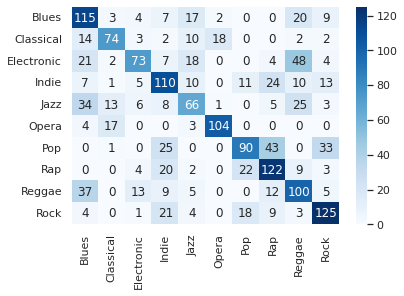

In [ ]:
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_test, y_pred)

labels = ['Blues', 'Classical', 'Electronic', 'Indie', 'Jazz', 'Opera', 'Pop', 'Rap', 'Reggae','Rock']
sns.heatmap(cf_matrix, annot=True, fmt='g', cmap='Blues', xticklabels=labels, yticklabels=labels)

Random Forest Best

In [ ]:
best2 = RandomForestClassifier(n_estimators=gs2.best_estimator_.n_estimators,max_features=gs2.best_estimator_.max_features)
best2.fit(X_train_fin, y_train)
y_pred = best2.predict(X_test_fin)

In [ ]:
sns.set(font_scale=1)

0.709240729841083
              precision    recall  f1-score   support

       Blues      0.661     0.650     0.655       177
   Classical      0.871     0.704     0.779       125
  Electronic      0.741     0.729     0.735       177
       Indie      0.592     0.654     0.622       191
        Jazz      0.649     0.540     0.590       161
       Opera      0.894     0.984     0.937       128
         Pop      0.715     0.667     0.690       192
         Rap      0.689     0.780     0.732       182
      Reggae      0.658     0.680     0.668       181
        Rock      0.740     0.768     0.753       185

    accuracy                          0.709      1699
   macro avg      0.721     0.716     0.716      1699
weighted avg      0.711     0.709     0.708      1699



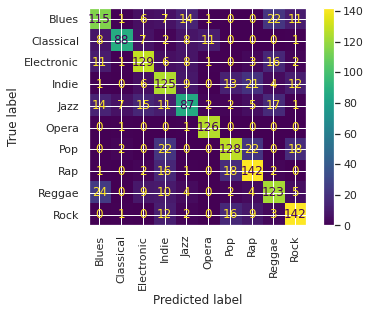

In [ ]:
print(acc(y_pred, y_test))
print(report(y_test, y_pred, digits=3))

import matplotlib.pyplot as plt
from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(best2, X_test_fin, y_test, values_format='g', xticks_rotation='vertical')
plt.show()

[[116   2   4   5  10   1   0   0  25  14]
 [  7  90   6   2   6  12   0   0   1   1]
 [ 12   1 128   8  12   1   0   2  12   1]
 [  1   0   6 138   4   0  14  15   3  10]
 [ 18   5  15  12  85   2   1   6  16   1]
 [  0   2   0   0   1 125   0   0   0   0]
 [  0   2   0  21   0   0 131  19   0  19]
 [  1   0   1  13   2   0  22 136   4   3]
 [ 27   0  10  11   5   0   2   8 112   6]
 [  0   1   2  17   1   0  13   6   1 144]]


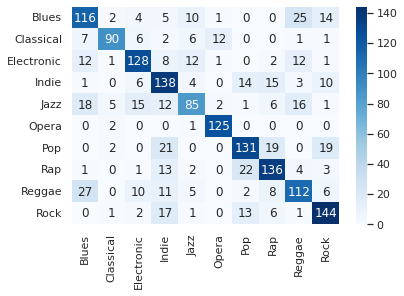

In [ ]:
from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_test, y_pred)
print(cf_matrix)

labels = ['Blues', 'Classical', 'Electronic', 'Indie', 'Jazz', 'Opera', 'Pop', 'Rap', 'Reggae','Rock']
          #'Blues', 'Classical', 'Electronic', 'Indie', 'Jazz', 'Opera', 'Pop', 'Rap', 'Reggae','Rock']
#labels = np.asarray(labels).reshape(2,2)
sns.heatmap(cf_matrix, annot=True, fmt='g', cmap='Blues', xticklabels=labels, yticklabels=labels)

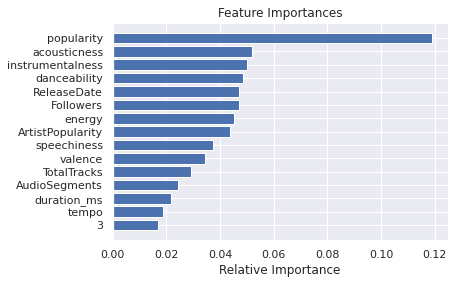

In [ ]:
features = X_train_fin.columns
importances = best2.feature_importances_
indices = np.argsort(importances)

num_features=15
#plt.figure(figsize=(10,100))
plt.title('Feature Importances')
#plt.barh(range(len(indices)), importances[indices], color='b', align='center')
plt.barh(range(num_features), importances[indices[-num_features:]], color='b', align='center')
plt.yticks(range(num_features), [features[i] for i in indices[-num_features:]])
plt.xlabel('Relative Importance')
plt.show()

SVM Best Model

In [ ]:
best3 = svm.SVC(C=gs3.best_estimator_.C,gamma=gs3.best_estimator_.gamma, kernel=gs3.best_estimator_.kernel)
best3.fit(X_train_fin, y_train)
y_pred = best3.predict(X_test_fin)

SVM grid accuracy 0.5932901706886404
              precision    recall  f1-score   support

       Blues      0.514     0.616     0.560       177
   Classical      0.700     0.616     0.655       125
  Electronic      0.638     0.469     0.541       177
       Indie      0.515     0.529     0.522       191
        Jazz      0.497     0.522     0.509       161
       Opera      0.806     0.812     0.809       128
         Pop      0.649     0.500     0.565       192
         Rap      0.615     0.659     0.637       182
      Reggae      0.522     0.586     0.552       181
        Rock      0.618     0.692     0.653       185

    accuracy                          0.593      1699
   macro avg      0.608     0.600     0.600      1699
weighted avg      0.600     0.593     0.593      1699



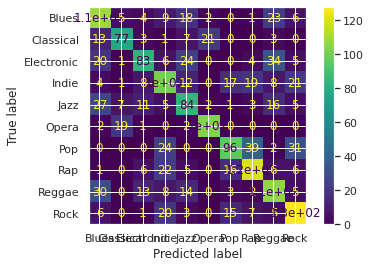

In [ ]:
print('SVM grid accuracy',acc(y_pred, y_test))
print(report(y_test, y_pred, digits=3))
plot_confusion_matrix(best3, X_test_fin, y_test)
plt.show()

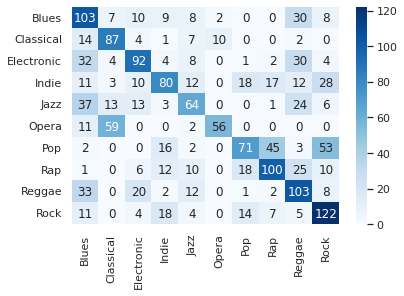

In [ ]:
cf_matrix = confusion_matrix(y_test, y_pred)

labels = ['Blues', 'Classical', 'Electronic', 'Indie', 'Jazz', 'Opera', 'Pop', 'Rap', 'Reggae','Rock']
sns.heatmap(cf_matrix, annot=True, fmt='g', cmap='Blues', xticklabels=labels, yticklabels=labels)

In [ ]:
X_train_cp2=X_train
X_test_cp2=X_test
y_train_cp2=y_train
y_test_cp2=y_test

In [ ]:
X_train_fin_xgb.columns.to_list()

['popularity',
 'acousticness',
 'danceability',
 'duration_ms',
 'energy',
 'instrumentalness',
 'liveness',
 'speechiness',
 'tempo',
 'valence',
 'ReleaseDate',
 'TotalTracks',
 'Followers',
 'ArtistPopularity',
 'mode',
 'time_signature',
 'AudioSegments',
 'SegDuration',
 'SegConfidence',
 'SegLoudnessMaxTime',
 'SegLoudnessEnd',
 0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 0,
 1,
 2,
 3,
 4,
 5,
 6,
 0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9]

In [ ]:
X_train_fin_xgb=X_train_fin
X_test_fin_xgb=X_test_fin
for dfs in [X_train_fin_xgb, X_test_fin_xgb]:
  for cols in X_train_fin_xgb.columns.to_list():
      transform(str(cols), dfs)

KeyError: ignored

In [ ]:
import xgboost
xgbc = xgboost.XGBClassifier(use_label_encoder=True,
                    eval_metric='error',
                    n_estimators=512,
                    max_depth=5,
                    learning_rate=0.5
                    ) 

xgbc.fit(X_train_xgb,  y_train)
y_pred=xgbc.predict(X_test_xgb)

In [ ]:
X_test_fin_xgb.columns.to_list()

['popularity',
 'acousticness',
 'danceability',
 'duration_ms',
 'energy',
 'instrumentalness',
 'liveness',
 'speechiness',
 'tempo',
 'valence',
 'ReleaseDate',
 'TotalTracks',
 'Followers',
 'ArtistPopularity',
 'mode',
 'time_signature',
 'AudioSegments',
 'SegDuration',
 'SegConfidence',
 'SegLoudnessMaxTime',
 'SegLoudnessEnd',
 0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 '0_1',
 '1_1',
 '2_1',
 '3_1',
 '4_1',
 '5_1',
 '6_1',
 '0_2',
 '1_2',
 '2_2',
 '3_2',
 '4_2',
 '5_2',
 '6_2',
 '7_1',
 '8_1',
 9]

In [ ]:
cols=pd.Series(X_train_fin_xgb.columns)
def df_column_uniquify(df):
    df_columns = df.columns
    new_columns = []
    for item in df_columns:
        counter = 0
        newitem = item
        while newitem in new_columns:
            counter += 1
            newitem = "{}_{}".format(item, counter)
        new_columns.append(newitem)
    df.columns = new_columns
    return df

In [ ]:
X_train_fin_xgb = df_column_uniquify(X_train_fin_xgb)
X_test_fin_xgb = df_column_uniquify(X_test_fin_xgb)

In [ ]:
import xgboost

xgbc = xgboost.XGBClassifier(use_label_encoder=False,
                    eval_metric='error',
                    n_estimators=512,
                    max_depth=5,
                    learning_rate=0.5,
                    scoring='f1'
                    ) 

xgbc.fit(X_train_fin_xgb,  y_train)
y_pred=xgbc.predict(X_test_fin_xgb)

xgboost accuracy  0.10359034726309593
              precision    recall  f1-score   support

       Blues      0.107     0.944     0.192       177
   Classical      0.000     0.000     0.000       125
  Electronic      0.000     0.000     0.000       177
       Indie      0.000     0.000     0.000       191
        Jazz      0.091     0.019     0.031       161
       Opera      0.000     0.000     0.000       128
         Pop      0.000     0.000     0.000       192
         Rap      0.000     0.000     0.000       182
      Reggae      0.062     0.033     0.043       181
        Rock      0.000     0.000     0.000       185

    accuracy                          0.104      1699
   macro avg      0.026     0.100     0.027      1699
weighted avg      0.026     0.104     0.027      1699



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1272: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



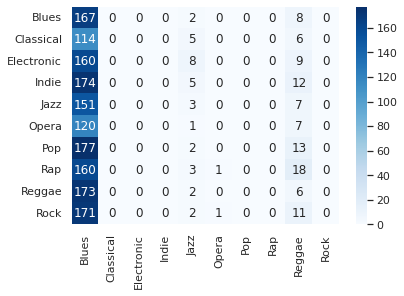

In [ ]:
print('xgboost accuracy ', acc(y_test, y_pred))
print(report(y_test, y_pred, digits=3))

from sklearn.metrics import confusion_matrix
cf_matrix = confusion_matrix(y_test, y_pred)

labels = ['Blues', 'Classical', 'Electronic', 'Indie', 'Jazz', 'Opera', 'Pop', 'Rap', 'Reggae','Rock']
sns.heatmap(cf_matrix, annot=True, fmt='g', cmap='Blues', xticklabels=labels, yticklabels=labels)